<a href="https://colab.research.google.com/github/BrainConnection/Dynamical_Decoupling_Project/blob/main/4.%20Measurement%20Induced%20Dephasing%20Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment Setting

In [2]:
!pip install qutip
!pip install numpy
!pip install matplotlib
!pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 40.6 MB/s eta 0:00:00


In [3]:
from qutip import *

import numpy as np
from numpy.random import uniform

import matplotlib.pyplot as plt

import scipy.interpolate
from scipy.optimize import curve_fit
from scipy.optimize import minimize

# 9. Photon Number Sweeping

Sweeping Kappa, DD Sequence N

## 1) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [4]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [5]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [6]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [7]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [8]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [9]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [10]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [11]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [12]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt_r'] # duration of the readout drive, in units of ns
    T_end = args['T_end_r'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

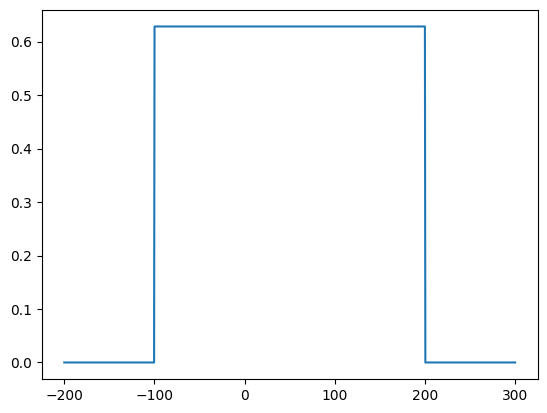

In [13]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt_r': -100, 'T_end_r': 200}))

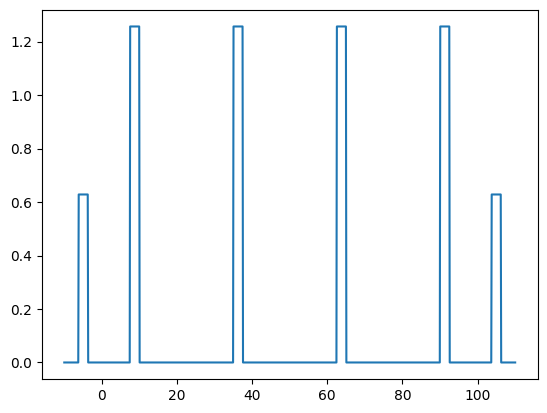

In [14]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt_q': -5, 'T_end_q': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

## 2) Drive Amplitude Detecting Function

In [28]:
def cost(A_rd, target_photon_number, omega_rd, kappa):

  N = 5

  omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
  omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
  g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
  kai = g*g/(omega_r-omega_q)

  sx = sigmax()
  sy = sigmay()
  sz = sigmaz()
  sp = basis(2,1)*basis(2,0).dag()
  a = destroy(N)

  sx_composite = tensor(sx, qeye(N))
  sy_composite = tensor(sy, qeye(N))
  sz_composite = tensor(sz, qeye(N))
  annihilate_composite = tensor(qeye(2), a)
  number_composite = tensor(qeye(2), a.dag()*a)

  op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r - omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  tlist = np.linspace(0, 1000, 10000)

  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': A_rd, 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
  )

  n_list = result.expect[4]
  n = n_list[-1]

  return float((target_photon_number - n)**2)

In [29]:
def alphan(A_rd, omega_rd, kappa):

  N = 5

  omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
  omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
  g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
  kai = g*g/(omega_r-omega_q)

  sx = sigmax()
  sy = sigmay()
  sz = sigmaz()
  sp = basis(2,1)*basis(2,0).dag()
  a = destroy(N)

  sx_composite = tensor(sx, qeye(N))
  sy_composite = tensor(sy, qeye(N))
  sz_composite = tensor(sz, qeye(N))
  annihilate_composite = tensor(qeye(2), a)
  number_composite = tensor(qeye(2), a.dag()*a)

  op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r - omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  tlist = np.linspace(0, 1000, 10000)

  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': A_rd, 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
  )

  alpha_list = result.expect[3]
  n_list = result.expect[4]
  alpha = alpha_list[-1]
  n = n_list[-1]

  return (alpha, n)

In [30]:
def build_callback(target_photon_number, omega_rd, kappa, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost(current_vector, target_photon_number, omega_rd, kappa)

    callback_dict["cost_history"].append(current_cost)

    print(
      "Iters. done: {} [Current cost: {}]".format(callback_dict["iters"], current_cost),
      end="\r",
      flush=True,
    )

  return callback

In [264]:
def A_rd(target_photon_number, omega_rd, kappa):

  callback_dict = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  callback = build_callback(target_photon_number, omega_rd, kappa, callback_dict)
  res = minimize(
    cost,
    0.1,
    args=(target_photon_number, omega_rd, kappa),
    method="bfgs",
    callback=callback,
  )

  print(res.x)

  return res.x

In [31]:
target_photon_number = 0.001
kappa = 2 * np.pi * 0.002
omega_rd = 2 * np.pi * 7.0 - kappa
A_rd = 0.1

type(cost(A_rd, target_photon_number, omega_rd, kappa))

float

In [32]:
target_photon_number = 0.001
kappa = 2 * np.pi * 0.002
omega_rd = 2 * np.pi * 7.0 - kappa

callback_dict = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
}

callback = build_callback(target_photon_number, omega_rd, kappa, callback_dict)
res = minimize(
    cost,
    0.1,
    args=(target_photon_number, omega_rd, kappa),
    method="bfgs",
    callback=callback,
)

print(res.x)

TypeError: The coefficient function must return a number

In [265]:
target_photon_number = 0.001
kappa = 2 * np.pi * 0.002
omega_rd = 2 * np.pi * 7.0 - kappa

A_rd(target_photon_number, omega_rd, kappa)

TypeError: The coefficient function must return a number

In [33]:
import numpy as np
from scipy.optimize import minimize
from qutip import *

def cost(A_rd, target_photon_number, omega_rd, kappa):
    N = 5

    omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
    omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
    g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
    kai = g*g/(omega_r-omega_q)

    sx = sigmax()
    sy = sigmay()
    sz = sigmaz()
    sp = basis(2,1)*basis(2,0).dag()
    a = destroy(N)

    sx_composite = tensor(sx, qeye(N))
    sy_composite = tensor(sy, qeye(N))
    sz_composite = tensor(sz, qeye(N))
    annihilate_composite = tensor(qeye(2), a)
    number_composite = tensor(qeye(2), a.dag()*a)

    psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))

    H0 = (omega_r - omega_rd)*number_composite + kai*tensor(sz, a.dag()*a)
    H1 = 0.5*tensor(qeye(2), a + a.dag())
    H2 = 0.5*sx_composite

    tlist = np.linspace(0, 1000, 10000)

    # Define the rotating frame transformations (placeholders, define according to your system's physics)
    Hrd_rotating_frame = lambda t, args: A_rd * np.sin(omega_rd * t)
    Hqd_rotating_frame = lambda t, args: 1  # replace with actual function

    result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops=[np.sqrt(kappa) * tensor(qeye(2), a)],
        args={'A': A_rd},  # update as per your system
        e_ops=[number_composite]
    )

    n_list = result.expect[0]
    n = n_list[-1]

    return float((target_photon_number - n)**2)

# Below part of the code should work as it is, provided the cost function is correct
def build_callback(target_photon_number, omega_rd, kappa, callback_dict):
    def callback(current_vector):
        callback_dict["iters"] += 1
        callback_dict["prev_vector"] = current_vector
        current_cost = cost(current_vector, target_photon_number, omega_rd, kappa)

        callback_dict["cost_history"].append(current_cost)
        print("Iters. done: {} [Current cost: {}]".format(callback_dict["iters"], current_cost), end="\r", flush=True)

    return callback

target_photon_number = 0.001
kappa = 2 * np.pi * 0.002
omega_rd = 2 * np.pi * 7.0 - kappa

callback_dict = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
}

callback = build_callback(target_photon_number, omega_rd, kappa, callback_dict)
res = minimize(
    cost,
    0.1,
    args=(target_photon_number, omega_rd, kappa),
    method="bfgs",
    callback=callback
)

print(res.x)


TypeError: The coefficient function must return a number

In [ ]:
alphan(omega_rd, kappa, Amp)

## 2) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.002$

In [112]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.002   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00089, 0.00126, 0.00155, 0.00179, 0.00201]

$\alpha$ = [-0.0044j, -0.0062j, -0.0076j, -0.0088j, -0.0099j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [113]:
A = [0.00089, 0.00126, 0.00155, 0.00179, 0.00201]
alpha = [-0.0044j, -0.0062j, -0.0076j, -0.0088j, -0.0099j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [114]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

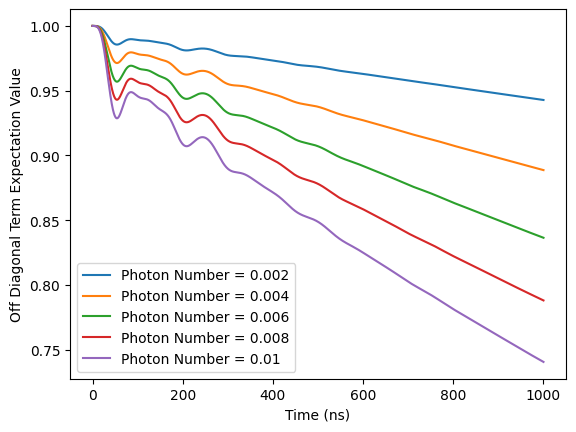

In [115]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

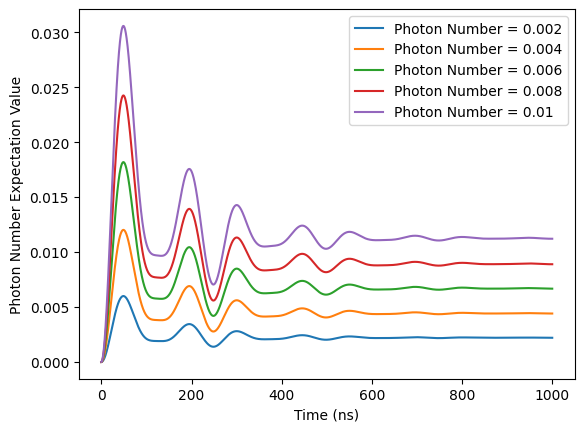

In [116]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [117]:
for i in range(5):
  print(alpha_list[i][-1])

(0.008954069691221896-0.004948301685579982j)
(0.012676548128400134-0.007005460838185849j)
(0.015594166319772895-0.00861782884898515j)
(0.018008746777302298-0.009952202452581457j)
(0.020222111890997135-0.011175378392870602j)


In [118]:
for i in range(5):
  print(n_list[i][-1])

0.0021978821750922774
0.004405198498531432
0.006666345036070856
0.008890587348737869
0.011210281134481399


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00284, 0.00402, 0.00493, 0.00569, 0.00626]

$\alpha$ = [-0.014j, -0.0198j, -0.0243j, -0.0281j, -0.0309j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [119]:
A = [0.00284, 0.00402, 0.00493, 0.00569, 0.00626]
alpha = [-0.014j, -0.0198j, -0.0243j, -0.0281j, -0.0309j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [120]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

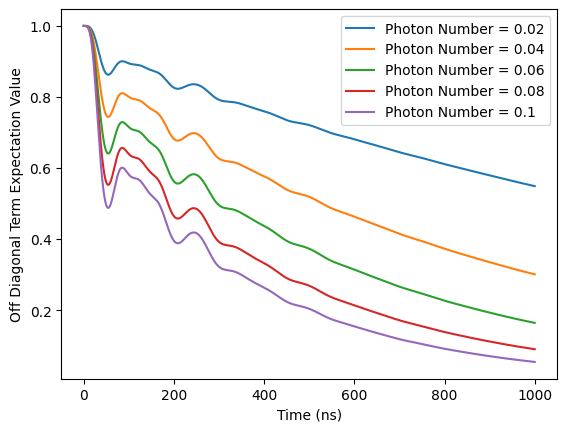

In [121]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

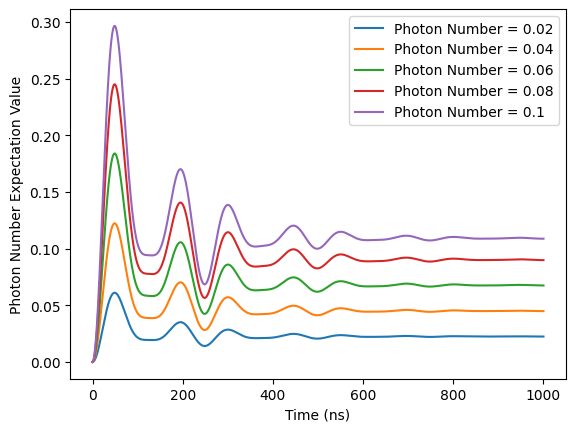

In [122]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [123]:
for i in range(5):
  print(alpha_list[i][-1])

(0.02857252208896891-0.01579009427232377j)
(0.040443892524388916-0.022350919767573068j)
(0.04959750621567843-0.027411187002643646j)
(0.0572387044294381-0.03163883936124377j)
(0.06296444122591324-0.034811565995956854j)


In [124]:
for i in range(5):
  print(n_list[i][-1])

0.022380048715073105
0.04484105317246633
0.06743957056845334
0.08983353969478115
0.10873052495616156


### $n$ = 0.1 to 1 regime

$A$ = [0.009, 0.013, 0.016, 0.0185, 0.0207]

$\alpha$ = [-0.0445j, -0.0647j, -0.0785j, -0.0877j, -0.0959j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [125]:
A = [0.009, 0.013, 0.016, 0.0185, 0.0207]
alpha = [-0.0445j, -0.0647j, -0.0785j, -0.0877j, -0.0959j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [126]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

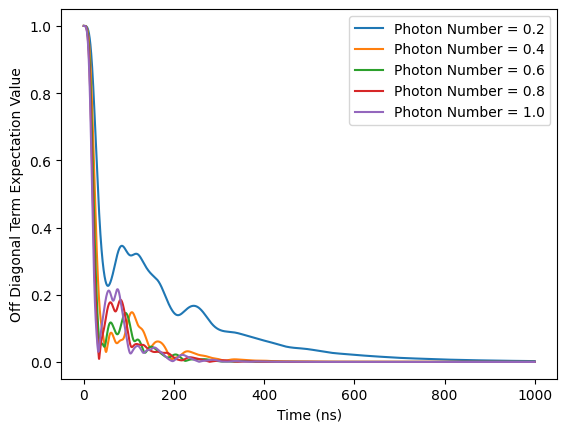

In [127]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

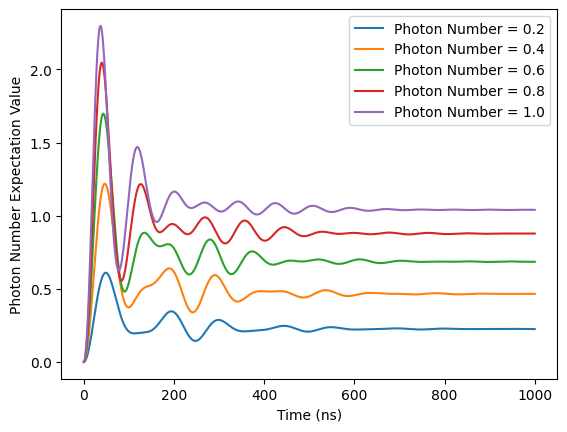

In [128]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [129]:
for i in range(5):
  print(alpha_list[i][-1])

(0.09022535344465907-0.05013726130408439j)
(0.12558840287834006-0.07208371125691306j)
(0.13620183520167314-0.08606085598075282j)
(0.12770452285456385-0.0949443795864468j)
(0.10643219740830787-0.09998482485454799j)


In [130]:
for i in range(5):
  print(n_list[i][-1])

0.22460104546437062
0.46529622124604747
0.6847156770248138
0.8775615075568121
1.0396551077358138


## 3) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.004$

In [131]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.004   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00093,0.00129,0.00156,0.0018,0.00201]

$\alpha$ = [-0.0089j, -0.0124j, -0.015j, -0.0173j, -0.0193j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [132]:
A = [0.00093,0.00129,0.00156,0.0018,0.00201]
alpha = [-0.0089j, -0.0124j, -0.015j, -0.0173j, -0.0193j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [133]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

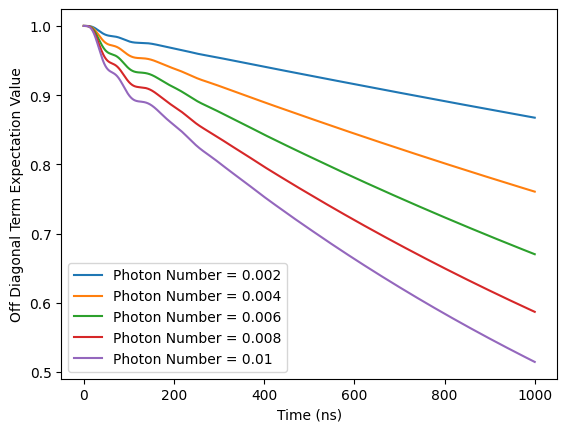

In [134]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

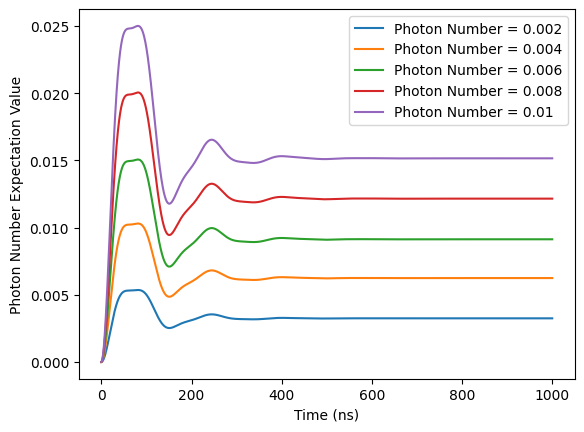

In [135]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [136]:
for i in range(5):
  print(alpha_list[i][-1])

(0.018599935112594036-0.013949951337007122j)
(0.02579990988399036-0.01934993246155035j)
(0.031199890490321232-0.023399918134440617j)
(0.03599987208347615-0.026999905023175744j)
(0.04019985358729339-0.03014989276736615j)


In [137]:
for i in range(5):
  print(n_list[i][-1])

0.0032433523751344796
0.0062403314566280765
0.009125936246975677
0.012149914888887206
0.015150268279712931


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00285,0.00405,0.00498,0.00573,0.00642]

$\alpha$ = [-0.0634j, -0.0894j, -0.1096j, -0.1266j, -0.1416j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [138]:
A = [0.00285,0.00405,0.00498,0.00573,0.00642]
alpha = [-0.0634j, -0.0894j, -0.1096j, -0.1266j, -0.1416j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [139]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

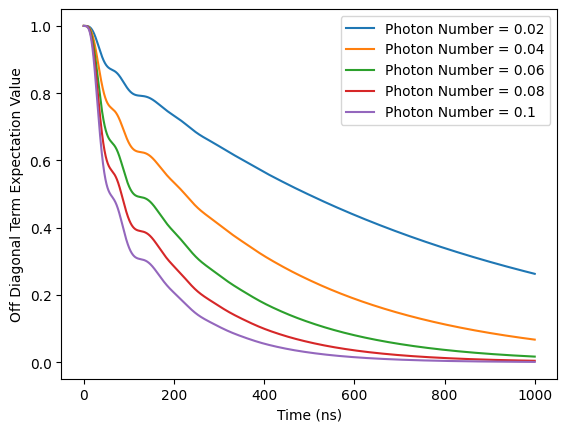

In [140]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

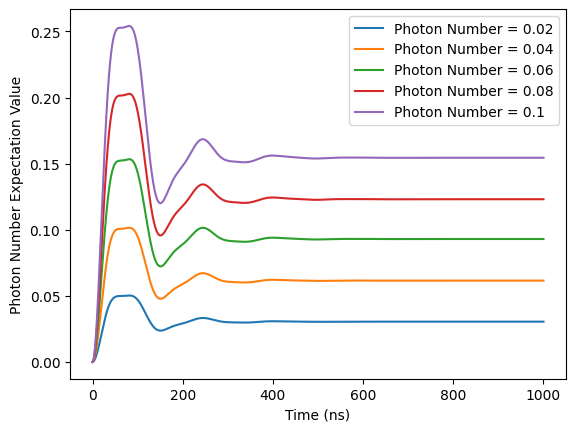

In [141]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [142]:
for i in range(5):
  print(alpha_list[i][-1])

(0.05699966256518953-0.04274980473377606j)
(0.08099664761318943-0.06074876553263186j)
(0.09958119217887675-0.07469358932481067j)
(0.11453839005442715-0.0859293048803337j)
(0.12824028565446904-0.09624658724739324j)


In [143]:
for i in range(5):
  print(n_list[i][-1])

0.030459129601454766
0.06150790908928144
0.09299318366063164
0.12309326094462937
0.15447512750619666


### $n$ = 0.1 to 1 regime

$A$ = [0.009, 0.013, 0.016, 0.0185, 0.0207]

$\alpha$ = [-0.0865j, -0.1245j, -0.1517j, -0.1720j, -0.1869j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [144]:
A = [0.009, 0.013, 0.016, 0.0185, 0.0207]
alpha = [-0.0865j, -0.1245j, -0.1517j, -0.1720j, -0.1869j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [145]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

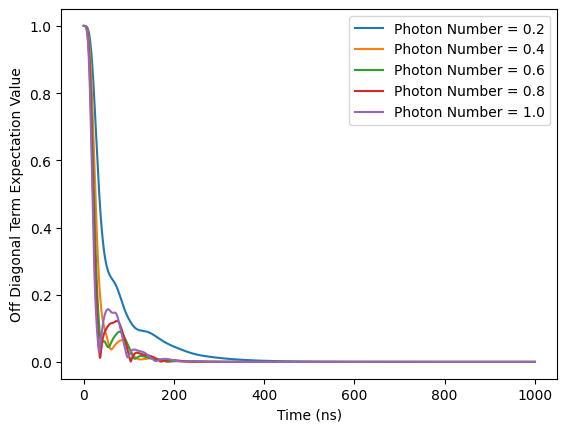

In [146]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

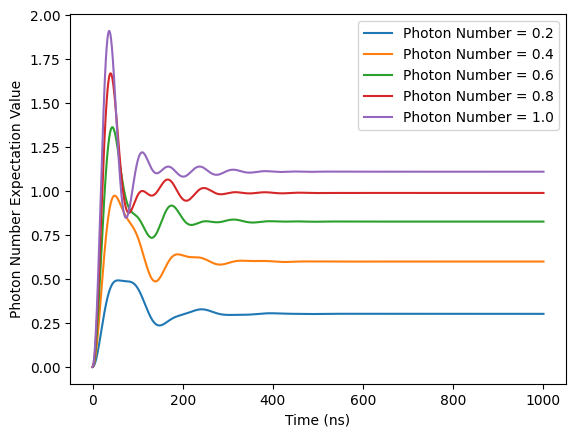

In [147]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [148]:
for i in range(5):
  print(alpha_list[i][-1])

(0.17759000738434766-0.1341956993647269j)
(0.22847181227037944-0.1844557568139369j)
(0.2205706879827328-0.206662963624491j)
(0.18131766294621052-0.21398361460213458j)
(0.13070589326325432-0.2145832580532251j)


In [149]:
for i in range(5):
  print(n_list[i][-1])

0.3019382160317321
0.5994807258744901
0.8266495444487826
0.9896702169927925
1.1104654517297363


## 4) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.006$

In [150]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.006   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00099,0.00135,0.00162,0.00186,0.00207]

$\alpha$ = [-0.0136j, -0.01857j, -0.02229j, -0.02559j, -0.02848j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [151]:
A = [0.00099,0.00135,0.00162,0.00186,0.00207]
alpha = [-0.0136j, -0.01857j, -0.02229j, -0.02559j, -0.02848j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [152]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

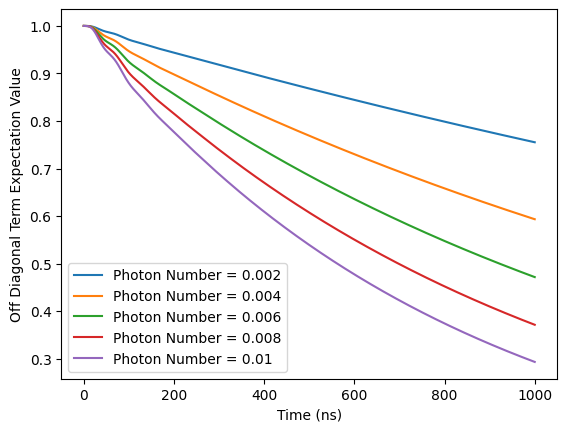

In [153]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

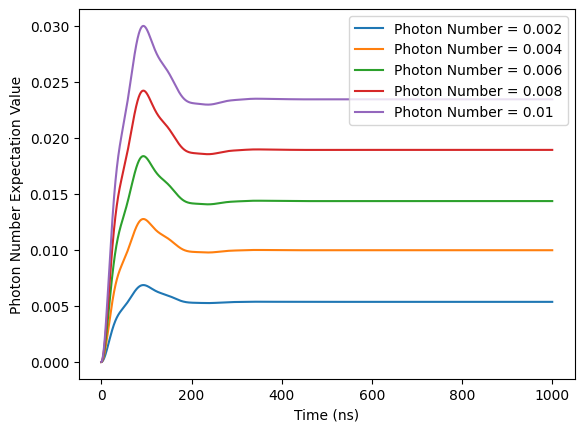

In [154]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [155]:
for i in range(5):
  print(alpha_list[i][-1])

(0.02465660350170516-0.03250188647678924j)
(0.03362264005691965-0.04432075349154952j)
(0.04034716333331298-0.053184900642004464j)
(0.04632450671589238-0.06106413456946408j)
(0.05155466152523876-0.06795844877630687j)


In [156]:
for i in range(5):
  print(n_list[i][-1])

0.005362811233745383
0.00997216947065579
0.014359923079823127
0.018929881593253057
0.02344566467513318


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00294,0.00414,0.0051,0.00588,0.00657,]

$\alpha$ = [-0.0404j, -0.05697j, -0.0701j, -0.08091j, -0.09041j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [157]:
A = [0.00294,0.00414,0.0051,0.00588,0.00657,]
alpha = [-0.0404j, -0.05697j, -0.0701j, -0.08091j, -0.09041j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [158]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

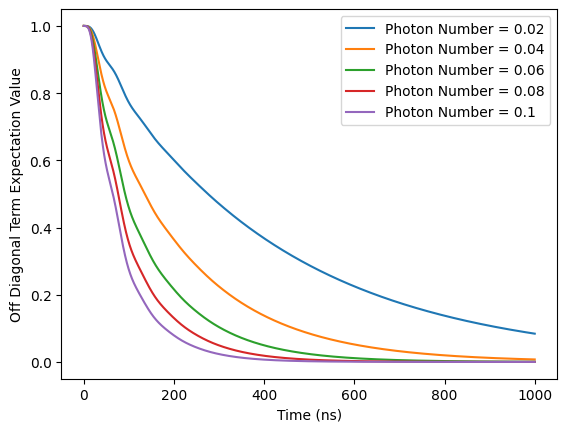

In [159]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

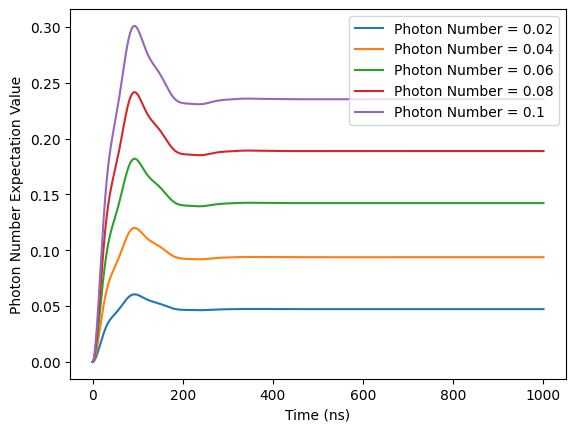

In [160]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [161]:
for i in range(5):
  print(alpha_list[i][-1])

(0.07322141407324093-0.09651983383212452j)
(0.10308544313366333-0.13589898683265705j)
(0.1268789133351887-0.16732899068379287j)
(0.14599414823149448-0.192703139304982j)
(0.16253511456183403-0.21487298350435657j)


In [162]:
for i in range(5):
  print(n_list[i][-1])

0.047294718269584264
0.09377030029963004
0.14222964112911643
0.1888490752152565
0.23528591528634726


### $n$ = 0.1 to 1 regime

$A$ = [0.0095, 0.0135, 0.0165, 0.019, 0.0215]

$\alpha$ = [-0.1306j, -0.1850j, -0.2238j, -0.2527j, -0.2765j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [163]:
A = [0.0095, 0.0135, 0.0165, 0.019, 0.0215]
alpha = [-0.1306j, -0.1850j, -0.2238j, -0.2527j, -0.2765j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [164]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

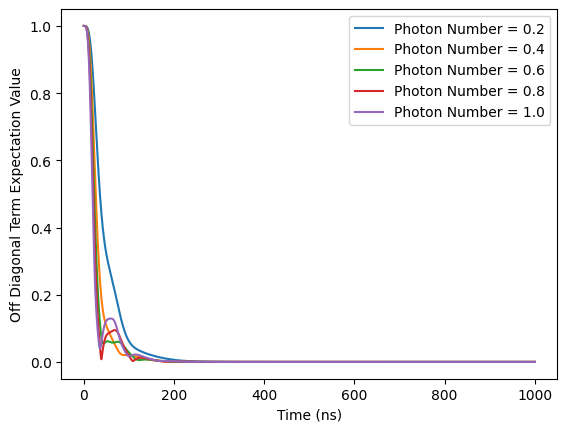

In [165]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

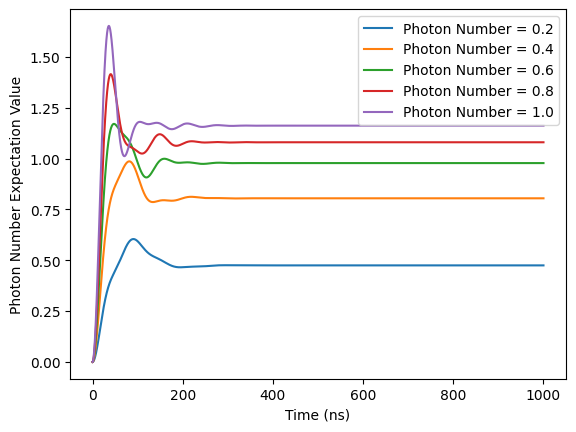

In [166]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [167]:
for i in range(5):
  print(alpha_list[i][-1])

(0.22045180875297984-0.2997714953275718j)
(0.22204115167777783-0.357540592331972j)
(0.1628921252844629-0.3555067116409237j)
(0.09688475716453883-0.34104270040096885j)
(0.028335442752113707-0.3241837466554642j)


In [168]:
for i in range(5):
  print(n_list[i][-1])

0.47463820108286575
0.8044663320471015
0.9776434552752675
1.0799685473951748
1.1616584196216966


## 5) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.008$

In [169]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.008   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00099,0.00138,0.00165,0.00192,0.00213]

$\alpha$ = [-0.017j, -0.02379j, -0.02844j, -0.0331j, -0.03672j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [170]:
A = [0.00099,0.00138,0.00165,0.00192,0.00213]
alpha = [-0.017j, -0.02379j, -0.02844j, -0.0331j, -0.03672j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [171]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

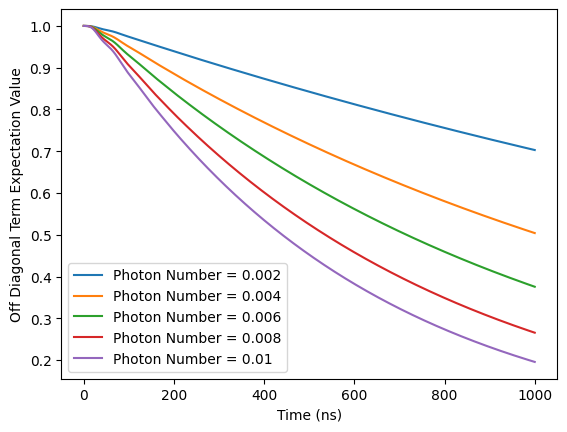

In [172]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

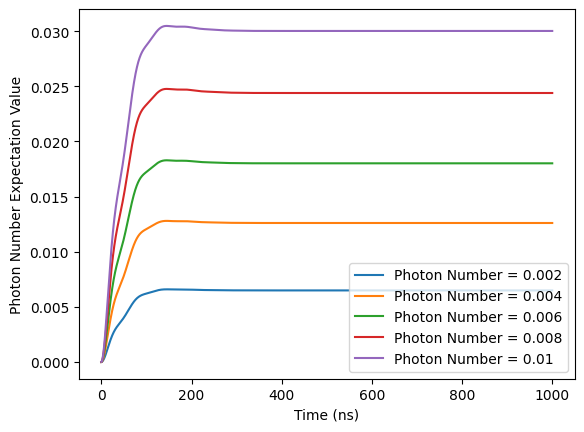

In [173]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [174]:
for i in range(5):
  print(alpha_list[i][-1])

(0.011647058687293923-0.05241176437880274j)
(0.01623529186768392-0.0730588190053674j)
(0.019411753655013308-0.08735291906146139j)
(0.022588192734654577-0.10164697370060993j)
(0.025058716650331894-0.11276449212132074j)


In [175]:
for i in range(5):
  print(n_list[i][-1])

0.0064859558417979584
0.012602646278272612
0.01801653955620731
0.02439527368784971
0.030023546026936555


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00303,0.00429,0.00525,0.00606,0.00678]

$\alpha$ = [-0.05224j, -0.07396j, -0.09051j, -0.10448j, -0.11689j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [176]:
A = [0.00303,0.00429,0.00525,0.00606,0.00678]
alpha = [-0.05224j, -0.07396j, -0.09051j, -0.10448j, -0.11689j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [177]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

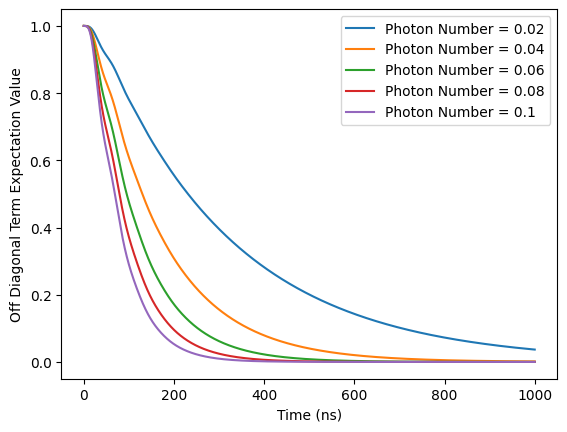

In [178]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

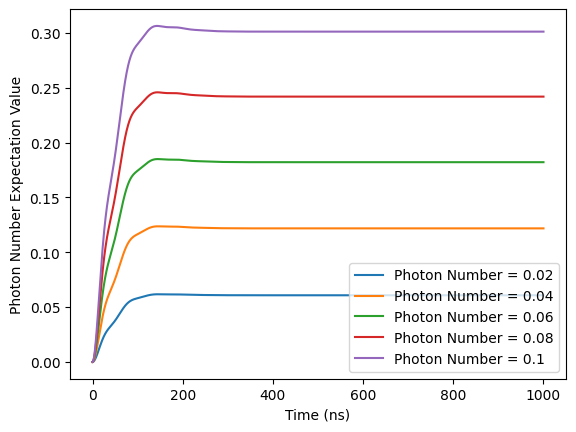

In [179]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [180]:
for i in range(5):
  print(alpha_list[i][-1])

(0.03564468907305026-0.16040702516551764j)
(0.050423791629967074-0.2270240529799925j)
(0.061516071834061485-0.27744390308148126j)
(0.07051506773645952-0.31926541050403046j)
(0.07792739097982757-0.3552664946871189j)


In [181]:
for i in range(5):
  print(n_list[i][-1])

0.06075416078070221
0.12174164840907398
0.18207256139521857
0.24184354845457112
0.3010883542453409


### $n$ = 0.1 to 1 regime

$A$ = [0.0095, 0.0135, 0.0175, 0.020, 0.0225]

$\alpha$ = [-0.16375j, -0.2320j, -0.2966j, -0.3319j, -0.3606j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [182]:
A = [0.0095, 0.0135, 0.0175, 0.020, 0.0225]
alpha = [-0.16375j, -0.2320j, -0.2966j, -0.3319j, -0.3606j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [183]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

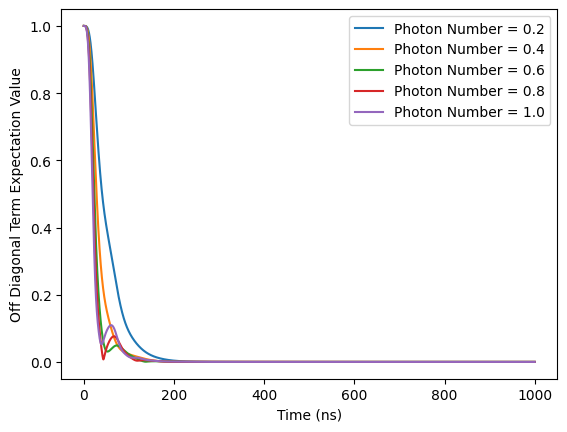

In [184]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

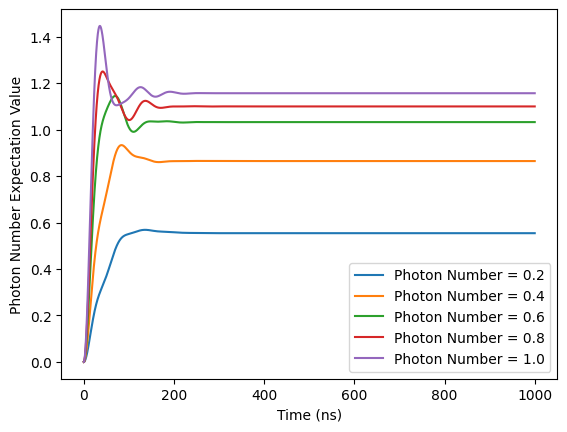

In [185]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [186]:
for i in range(5):
  print(alpha_list[i][-1])

(0.09357776008520598-0.4665662461285943j)
(0.057614204152875936-0.512264692362885j)
(-0.021331746319458438-0.4718349308572972j)
(-0.07388887252885809-0.43982592449190805j)
(-0.12447166859640127-0.4111733976178645j)


In [187]:
for i in range(5):
  print(n_list[i][-1])

0.5540474172773134
0.8644466683616046
1.0321389112479677
1.0995648112249885
1.1564251807918018


## 6) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.010$

In [188]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01    # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00101, 0.00142, 0.00173, 0.00200, 0.00224]

$\alpha$ = [-0.0202j, -0.0284j, -0.0346j, -0.04j, -0.0448j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [189]:
A = [0.00101, 0.00142, 0.00173, 0.00200, 0.00224]
alpha = [-0.0202j, -0.0284j, -0.0346j, -0.04j, -0.0448j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [190]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

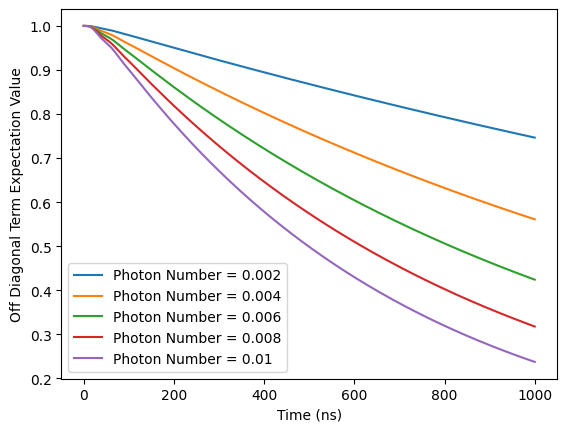

In [191]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

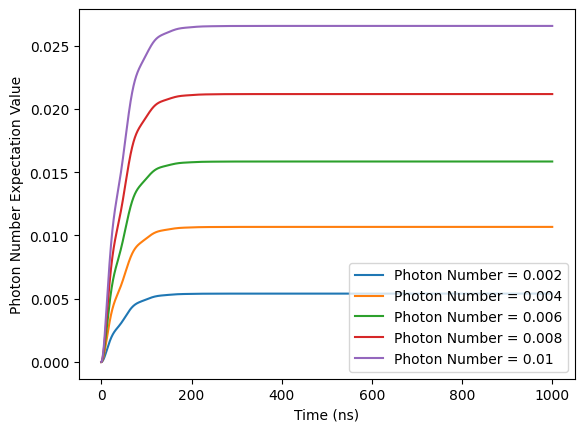

In [192]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [193]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.01188235293437852-0.053470588092223374j)
(-0.01670588232643056-0.07517646808462702j)
(-0.02035294117267718-0.09158822134964177j)
(-0.0235294117579051-0.10588230218328942j)
(-0.026352941175167163-0.11858809640239697j)


In [194]:
for i in range(5):
  print(n_list[i][-1])

0.0054005293973144386
0.010675058468016795
0.015844762293487667
0.021176460436657406
0.026563733594136333


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00317, 0.00447, 0.00548, 0.00633, 0.00708]

$\alpha$ = [-0.0634j, -0.0894j, -0.1096j, -0.1266j, -0.1416j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [195]:
A = [0.00317, 0.00447, 0.00548, 0.00633, 0.00708]
alpha = [-0.0634j, -0.0894j, -0.1096j, -0.1266j, -0.1416j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [196]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

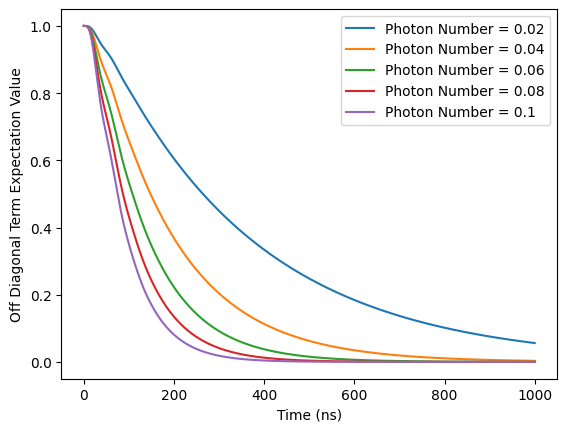

In [197]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

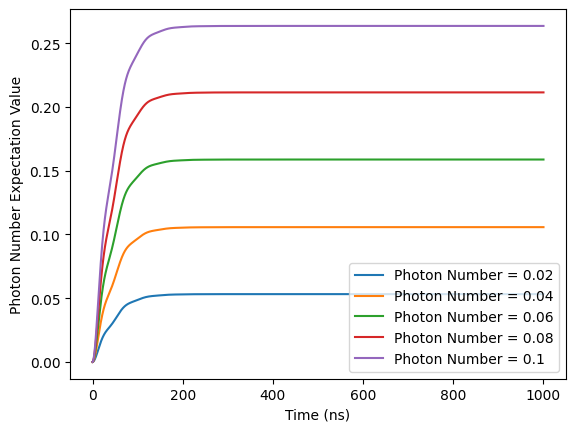

In [198]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [199]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.03729411763761153-0.16782056137451057j)
(-0.052588235088087625-0.23658937898752036j)
(-0.0644705869559929-0.28980042868061096j)
(-0.0744705835861864-0.3340979490895477j)
(-0.08329410500503827-0.3723749770122649j)


In [200]:
for i in range(5):
  print(n_list[i][-1])

0.05319911795571872
0.10575545240741942
0.15881063491697192
0.21148400177368137
0.2636414837246814


### $n$ = 0.1 to 1 regime

$A$ = [0.01, 0.01425, 0.0175, 0.0203, 0.023]

$\alpha$ = [-0.200j, -0.285j, -0.350j, -0.406j, -0.460j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [201]:
A = [0.01, 0.01425, 0.0175, 0.0203, 0.023]
alpha = [-0.200j, -0.285j, -0.350j, -0.406j, -0.460j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [202]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

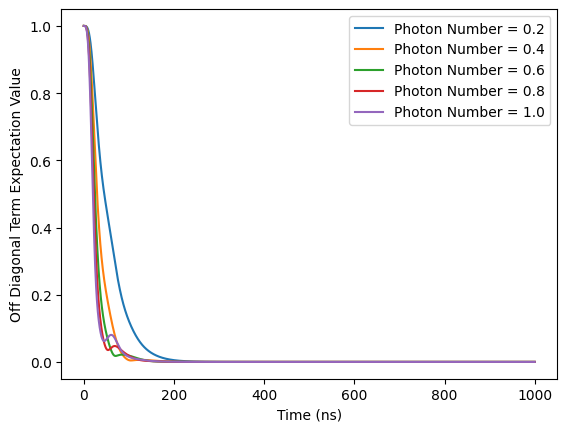

In [203]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

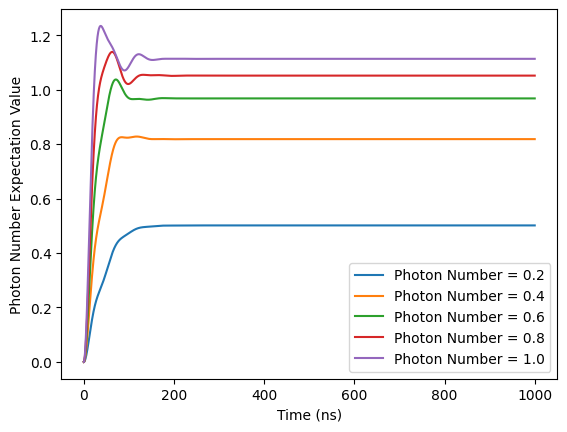

In [204]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [205]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.11764678622090523-0.5013218089147776j)
(-0.16764093969870364-0.5742068539070982j)
(-0.20584635453792524-0.553010438549212j)
(-0.23869708266320727-0.5179790732048428j)
(-0.27023210352806143-0.48398539561355175j)


In [206]:
for i in range(5):
  print(n_list[i][-1])

0.5013218089147776
0.8182447668176135
0.967768267461117
1.0514975186058273
1.113166409911158


## 7) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.012$

In [207]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.012   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00111,0.00153,0.00183,0.0021,0.00234]

$\alpha$ = [-0.02448j, -0.0337j, -0.040367j, -0.04632j, -0.051617j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [208]:
A = [0.00111,0.00153,0.00183,0.0021,0.00234]
alpha = [-0.02448j, -0.0337j, -0.040367j, -0.04632j, -0.051617j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [209]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

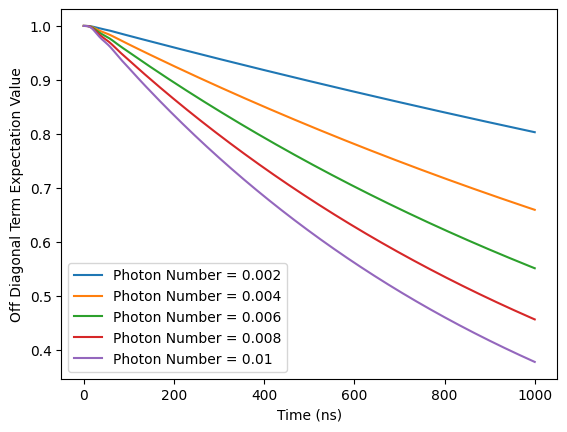

In [210]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

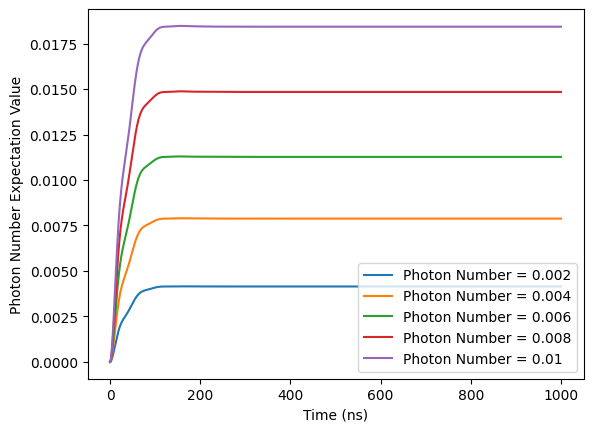

In [211]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [212]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.02561538456793602-0.04482692298130423j)
(-0.035307692117564266-0.06178846098168014j)
(-0.04223076833848081-0.07390384347863542j)
(-0.048461535397363587-0.0848076831340557j)
(-0.05399999198411311-0.09449997596251081j)


In [213]:
for i in range(5):
  print(n_list[i][-1])

0.004146490375770645
0.007878028775164223
0.011270336130491915
0.014841344548459768
0.018427495312689657


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00327, 0.00457, 0.00568, 0.00653, 0.00728]

$\alpha$ = [-0.0721j, -0.1008j, -0.1253j, -0.1440j, -0.16058j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [214]:
A = [0.00327, 0.00457, 0.00568, 0.00653, 0.00728]
alpha = [-0.0721j, -0.1008j, -0.1253j, -0.1440j, -0.16058j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [215]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

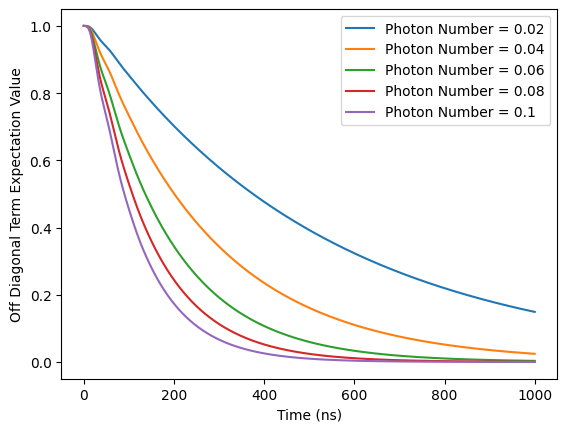

In [216]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

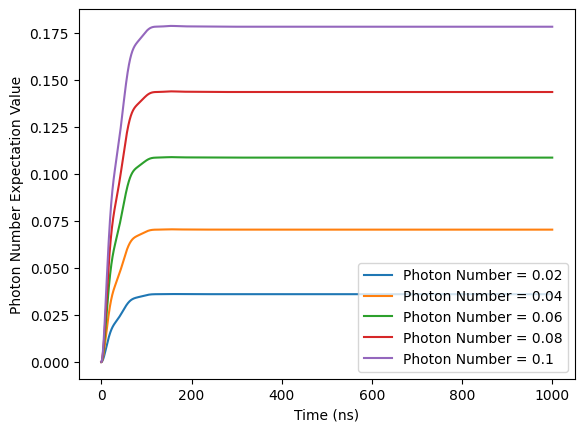

In [217]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [218]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.07546138223741328-0.1320572236491411j)
(-0.10545860638237935-0.18454889634588137j)
(-0.1310579623966021-0.22932773528142325j)
(-0.15063108575602796-0.2635278794084412j)
(-0.16785015164052622-0.29355047278351265j)


In [219]:
for i in range(5):
  print(n_list[i][-1])

0.035985593444391055
0.07028237135838995
0.10854846136654041
0.1434030877114272
0.1780872868219983


### $n$ = 0.1 to 1 regime

$A$ = [0.0112, 0.01525, 0.0185, 0.0213, 0.024]

$\alpha$ = [-0.24695j, -0.3350j, -0.4021j, -0.4538j, -0.4948j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [220]:
A = [0.0112, 0.01525, 0.0185, 0.0213, 0.024]
alpha = [-0.24695j, -0.3350j, -0.4021j, -0.4538j, -0.4948j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [221]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

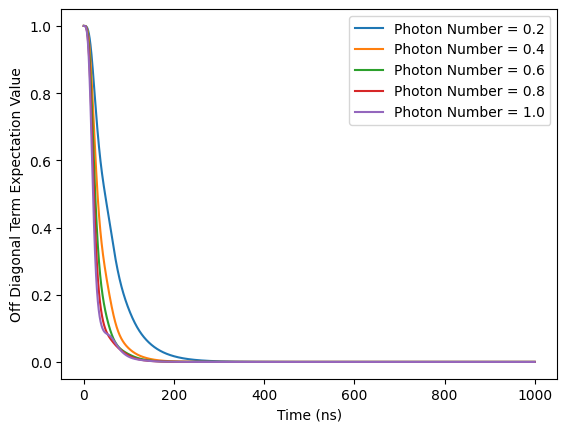

In [222]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

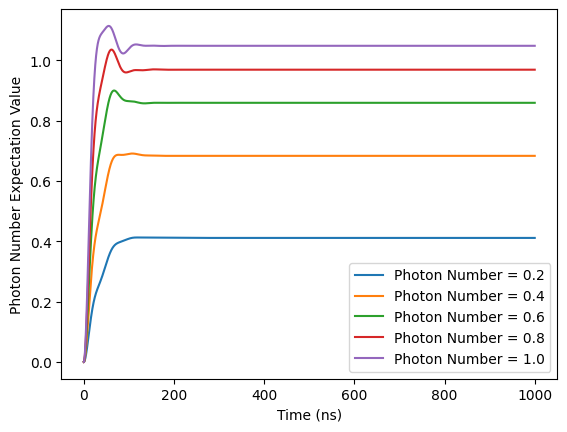

In [223]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [224]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.2544856300569452-0.4403807926213671j)
(-0.3258001847530457-0.5375091539515577j)
(-0.3635685163811886-0.5571179468278971j)
(-0.3866444745551695-0.5457303319187969j)
(-0.4052134267343678-0.5239298508317258j)


In [225]:
for i in range(5):
  print(n_list[i][-1])

0.4110220731132768
0.6830845498134388
0.8588901680263419
0.9686713391558653
1.0478597016634517


## 8) Photon Number

$\omega_r - \omega_{rd} = 0$

$\kappa = 2\pi0.014$

In [226]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.014   # external coupling rate of resonator in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

### $n$ = 0.001 to 0.01 regime

$A$ = [0.00111,0.00153,0.00193,0.0022,0.00244]

$\alpha$ = [-0.02607j, -0.03594j, -0.04533j, -0.05167j, -0.0573j]

$n$ = [0.002, 0.004, 0.006, 0.008, 0.010]

In [227]:
A = [0.00111,0.00153,0.00193,0.0022,0.00244]
alpha = [-0.02607j, -0.03594j, -0.04533j, -0.05167j, -0.0573j]
n = [0.002, 0.004, 0.006, 0.008, 0.010]

In [228]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

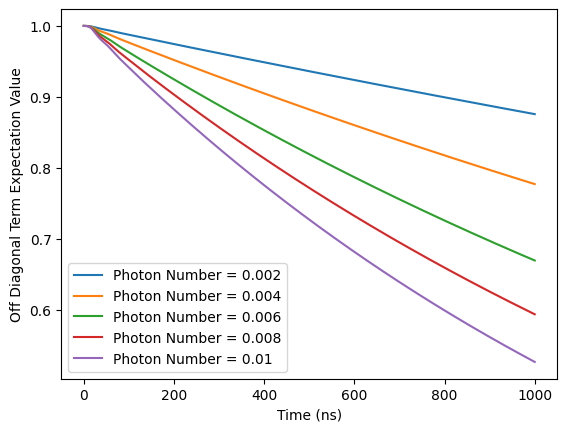

In [229]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

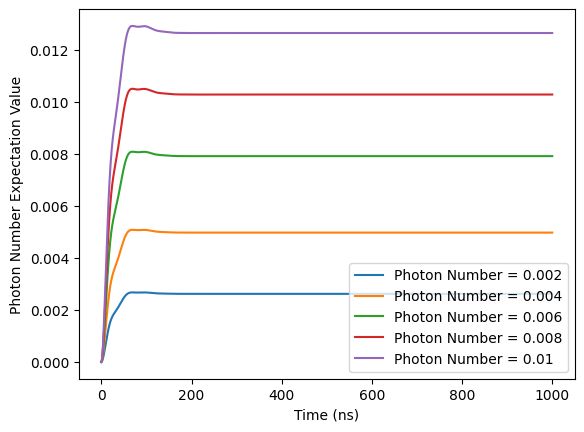

In [230]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [231]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.027732923075139315-0.03299261538149406j)
(-0.03822646150659618-0.045476307636546816j)
(-0.04822030743632063-0.05736553801358882j)
(-0.054966153018831086-0.06539076778304449j)
(-0.06096245944892402-0.07252430403584523j)


In [232]:
for i in range(5):
  print(n_list[i][-1])

0.0026158430766755995
0.004969910763136895
0.00790824916901617
0.010275692080192697
0.012639950131961588


### $n$ = 0.01 to 0.1 regime

$A$ = [0.00337, 0.00482, 0.006, 0.00683, 0.00768]

$\alpha$ = [-0.07916j, -0.1132j, -0.1409j, -0.1604j, -0.1804j]

$n$ = [0.02, 0.04, 0.06, 0.08, 0.10]

In [233]:
A = [0.00337, 0.00482, 0.006, 0.00683, 0.00768]
alpha = [-0.07916j, -0.1132j, -0.1409j, -0.1604j, -0.1804j]
n = [0.02, 0.04, 0.06, 0.08, 0.10]

In [234]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

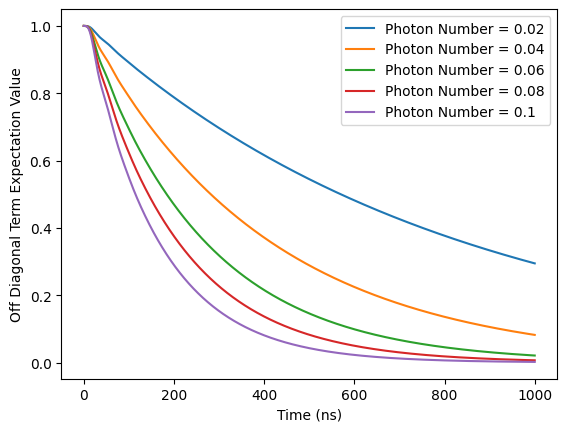

In [235]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

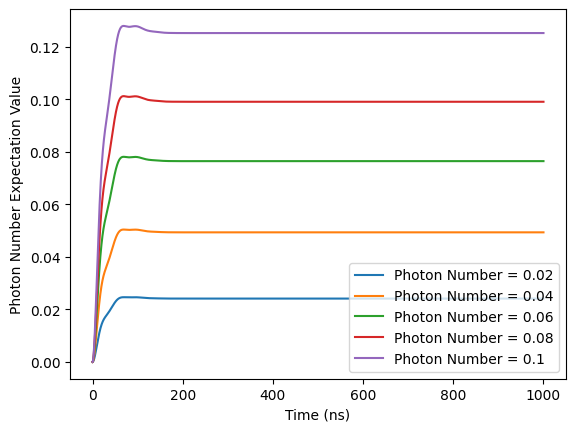

In [236]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [237]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.08419811661576358-0.10016670408174867j)
(-0.12042496568719685-0.14326369005622985j)
(-0.1499017532534989-0.17832806893266034j)
(-0.17062682735325244-0.20297695022745058j)
(-0.19183289289291414-0.22818756930100528j)


In [238]:
for i in range(5):
  print(n_list[i][-1])

0.02411155662539234
0.04932364186221608
0.07642631525685435
0.0990237550038204
0.12517718087369395


### $n$ = 0.1 to 1 regime

$A$ = [0.0112, 0.01525, 0.0185, 0.0213, 0.024]

$\alpha$ = [-0.263j, -0.3583j, -0.4511j, -0.5005j, -0.5568j]

$n$ = [0.2, 0.4, 0.6, 0.8, 1.0]

In [239]:
A = [0.0112, 0.0153, 0.0195, 0.022, 0.0255]
alpha = [-0.263j, -0.3583j, -0.4511j, -0.5005j, -0.5568j]
n = [0.2, 0.4, 0.6, 0.8, 1.0]

In [240]:
plus_list = []
alpha_list = []
n_list = []

for i in range(5):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*20+10, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(np.sqrt((result.expect[0])**2 + (result.expect[1])**2))
  alpha_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

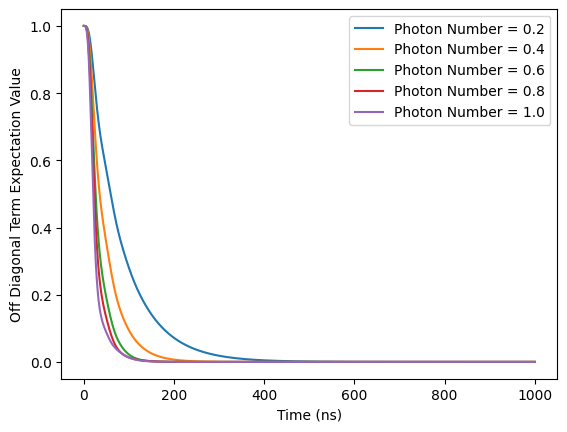

In [241]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, plus_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

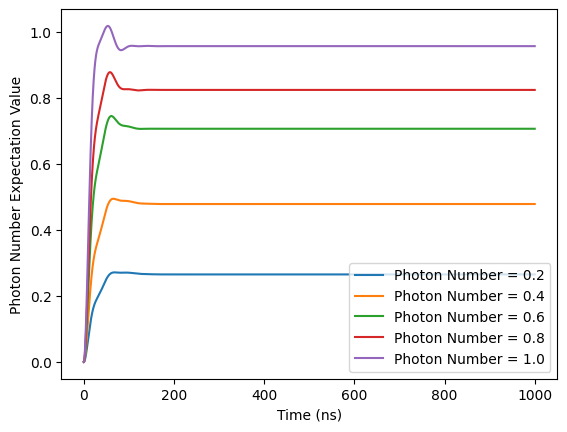

In [242]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(5):
  ax.plot(tlist, n_list[i], label = 'Photon Number = {0}'.format(n[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [243]:
for i in range(5):
  print(alpha_list[i][-1])

(-0.27877912882710204-0.33106366989009667j)
(-0.3723229331093512-0.4373681830076374j)
(-0.44554444055513254-0.50672790724089j)
(-0.4753647099105467-0.5239588566940763j)
(-0.5037485980794295-0.5248049756082852j)


In [244]:
for i in range(5):
  print(n_list[i][-1])

0.26485093591207687
0.477980942858346
0.7057995850855265
0.8233639176621208
0.9558947770008063


## 9) Summary

n 0.004

0.00126,0.00129,0.00135,0.00138,0.00142,0.00153,0.00153

-0.0062j,-0.0124j,-0.01857j,-0.02379j,-0.0284j,-0.0337j,-0.03594j


n 0.01

0.00201,0.00201,0.00207,0.00213,0.00224,0.00234,0.00244

-0.0099j,-0.0193j,-0.02848j,-0.03672j,-0.0448j,-0.051617j,-0.0573j


n 0.04

0.00402,0.00405,0.00414,0.00429,0.00447,0.00457,0.00482

-0.0198j,-0.0894j,-0.05697j,-0.07396j,-0.0894j,-0.1008j,-0.1132j


n 0.1

0.00626,0.00642,0.00657,0.00678,0.00708,0.00728,0.00768

-0.0309j,-0.1416j,-0.09041j,-0.11689j,-0.1416j,-0.16058j,-0.1804j


n 0.4

0.013,0.013,0.0135,0.0135,0.01425,0.01525,0.01525

-0.0647j,-0.1245j,-0.1850j,-0.2320j,-0.285j,-0.3350j,-0.3583j


n 1

0.0207,0.0207,0.0215,0.0225,0.023,0.024,0.024

-0.0959j,-0.1869j,-0.2765j,-0.3606j,-0.460j,-0.4948j,-0.5568j

# 10. Measurement Induced Dephasing Dynamical Decoupling - $N, \kappa$ Sweeping

Initial State : Coherent State + Detune

## 1) Filtering Function (μs, MHz scale)

In [ ]:
omega_list = np.linspace(0,10,10000)

def filter(omega_list, tau, N):

  if N==0:
    f = (4*np.sin(2*np.pi*tau*omega_list/2)*np.sin(2*np.pi*tau*omega_list/2))/(2*np.pi*2*np.pi*omega_list**2)
    return f

  elif N==1:
    f = ((4*np.sin(2*np.pi*tau*omega_list/4)*np.sin(2*np.pi*tau*omega_list/4))/(2*np.pi*omega_list))**2
    return f

  else:
    f = (2*np.sin(2*np.pi*tau*omega_list/2)*(np.cos(2*np.pi*tau*omega_list/(2*N))-1)/(2*np.pi*omega_list*np.cos(2*np.pi*tau*omega_list/(2*N))))**2
    return f

<ipython-input-14-09a753571ad5>:6: RuntimeWarning: invalid value encountered in divide
  f = (4*np.sin(2*np.pi*tau*omega_list/2)*np.sin(2*np.pi*tau*omega_list/2))/(2*np.pi*2*np.pi*omega_list**2)
<ipython-input-14-09a753571ad5>:10: RuntimeWarning: invalid value encountered in divide
  f = ((4*np.sin(2*np.pi*tau*omega_list/4)*np.sin(2*np.pi*tau*omega_list/4))/(2*np.pi*omega_list))**2
<ipython-input-14-09a753571ad5>:14: RuntimeWarning: invalid value encountered in divide
  f = (2*np.sin(2*np.pi*tau*omega_list/2)*(np.cos(2*np.pi*tau*omega_list/(2*N))-1)/(2*np.pi*omega_list*np.cos(2*np.pi*tau*omega_list/(2*N))))**2


Text(0, 0.5, 'Filter Function Distribution')

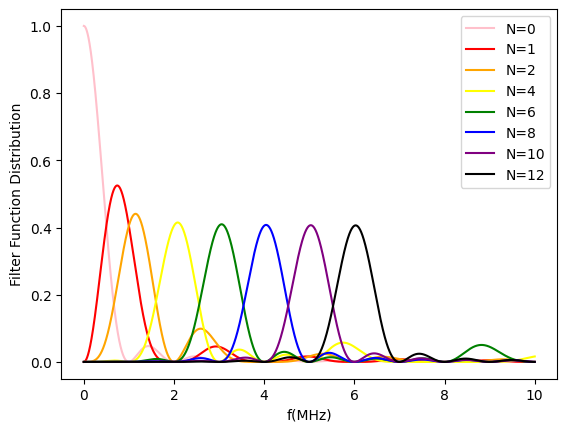

In [ ]:
tau = 1

fig, ax = plt.subplots(1, 1)
ax.plot(omega_list, filter(omega_list, tau, 0), label = 'N=0', color='pink')
ax.plot(omega_list, filter(omega_list, tau, 1), label = 'N=1', color='red')
ax.plot(omega_list, filter(omega_list, tau, 2), label = 'N=2', color='orange')
ax.plot(omega_list, filter(omega_list, tau, 4), label = 'N=4', color='yellow')
ax.plot(omega_list, filter(omega_list, tau, 6), label = 'N=6', color='green')
ax.plot(omega_list, filter(omega_list, tau, 8), label = 'N=8', color='blue')
ax.plot(omega_list, filter(omega_list, tau, 10), label = 'N=10', color='purple')
ax.plot(omega_list, filter(omega_list, tau, 12), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('f(MHz)')
ax.set_ylabel('Filter Function Distribution')

<ipython-input-14-09a753571ad5>:6: RuntimeWarning: invalid value encountered in divide
  f = (4*np.sin(2*np.pi*tau*omega_list/2)*np.sin(2*np.pi*tau*omega_list/2))/(2*np.pi*2*np.pi*omega_list**2)
<ipython-input-14-09a753571ad5>:10: RuntimeWarning: invalid value encountered in divide
  f = ((4*np.sin(2*np.pi*tau*omega_list/4)*np.sin(2*np.pi*tau*omega_list/4))/(2*np.pi*omega_list))**2
<ipython-input-14-09a753571ad5>:14: RuntimeWarning: invalid value encountered in divide
  f = (2*np.sin(2*np.pi*tau*omega_list/2)*(np.cos(2*np.pi*tau*omega_list/(2*N))-1)/(2*np.pi*omega_list*np.cos(2*np.pi*tau*omega_list/(2*N))))**2


Text(0, 0.5, 'Filter Function Distribution')

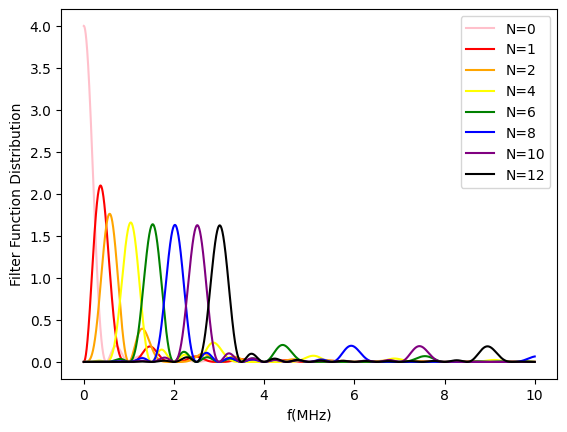

In [ ]:
tau = 2

fig, ax = plt.subplots(1, 1)
ax.plot(omega_list, filter(omega_list, tau, 0), label = 'N=0', color='pink')
ax.plot(omega_list, filter(omega_list, tau, 1), label = 'N=1', color='red')
ax.plot(omega_list, filter(omega_list, tau, 2), label = 'N=2', color='orange')
ax.plot(omega_list, filter(omega_list, tau, 4), label = 'N=4', color='yellow')
ax.plot(omega_list, filter(omega_list, tau, 6), label = 'N=6', color='green')
ax.plot(omega_list, filter(omega_list, tau, 8), label = 'N=8', color='blue')
ax.plot(omega_list, filter(omega_list, tau, 10), label = 'N=10', color='purple')
ax.plot(omega_list, filter(omega_list, tau, 12), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('f(MHz)')
ax.set_ylabel('Filter Function Distribution')

In [ ]:
def lorentzian(omega_list, kappa, n):
  return n*kappa/((2*np.pi*omega_list)**2 + (kappa/2)**2)

In [ ]:
def chi_N(tau, kappa, n, kai, N):
  freq_list = np.linspace(0.01,10000.01,1000000)
  filt = filter(freq_list, tau, N)
  spec = lorentzian(freq_list, kappa, n)
  A = 0
  for i in range(10000):
    A = A + 2*np.pi * 2*kai**2 * filt[i]*spec[i]*0.01

  return A

### $n = 0.01$

$\kappa = 2 \pi 10 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

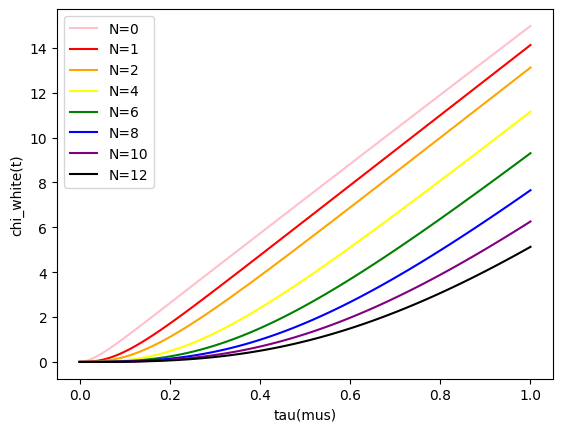

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

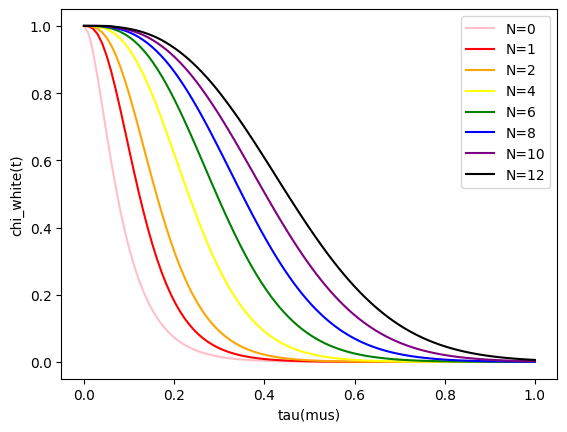

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 0.01$

$\kappa = 2 \pi 3 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

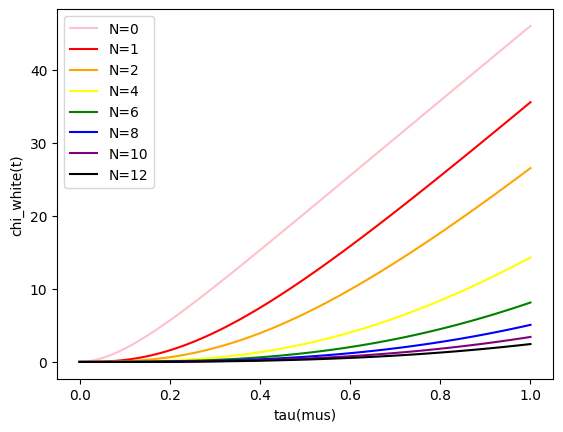

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

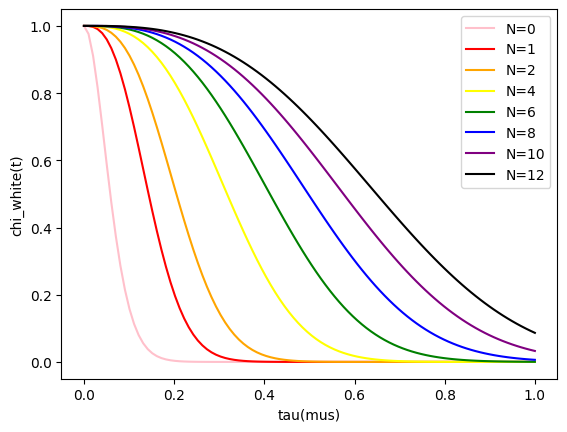

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.01
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 0.1$

$\kappa = 2 \pi 10 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

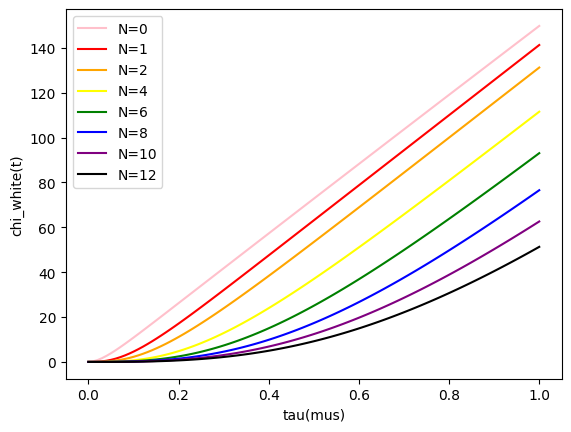

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

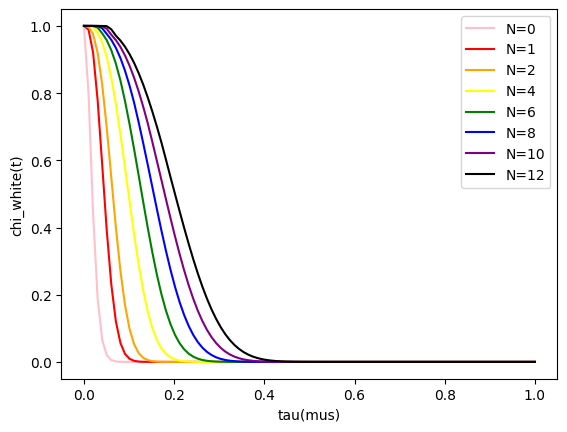

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 0.1$

$\kappa = 2 \pi 3 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

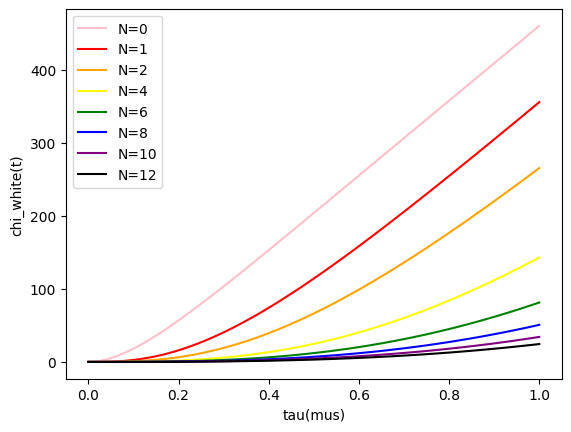

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

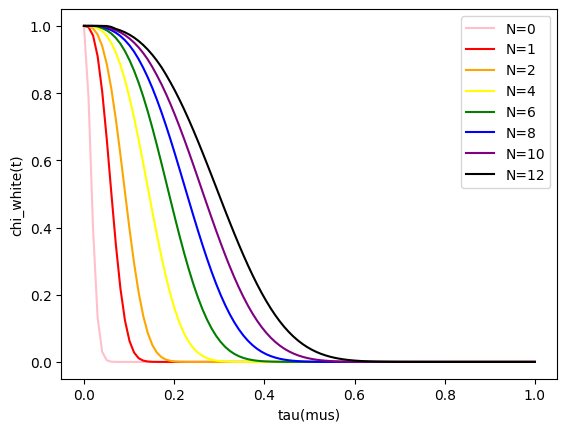

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 0.1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 1$

$\kappa = 2 \pi 10 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

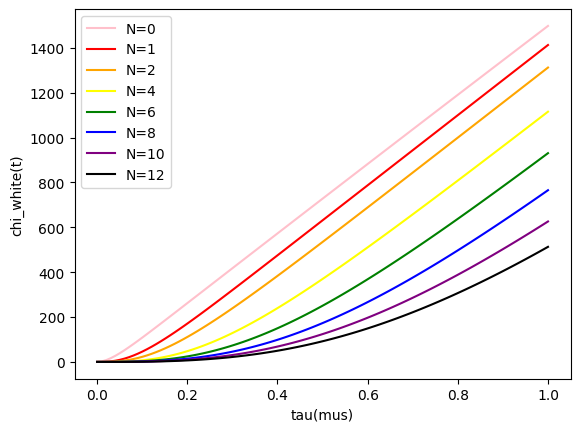

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

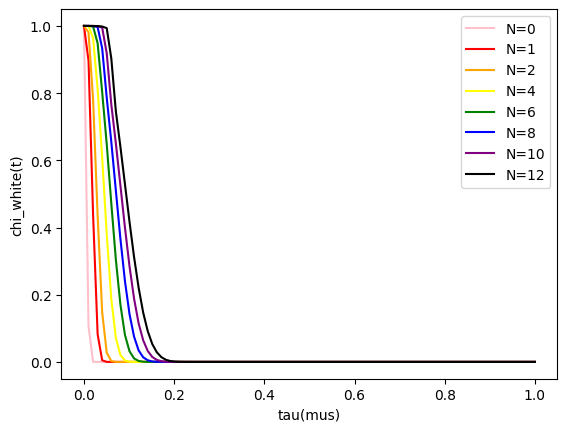

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*10
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

### $n = 1$

$\kappa = 2 \pi 3 MHz$

$ \tau = 1 \mu s $

Text(0, 0.5, 'chi_white(t)')

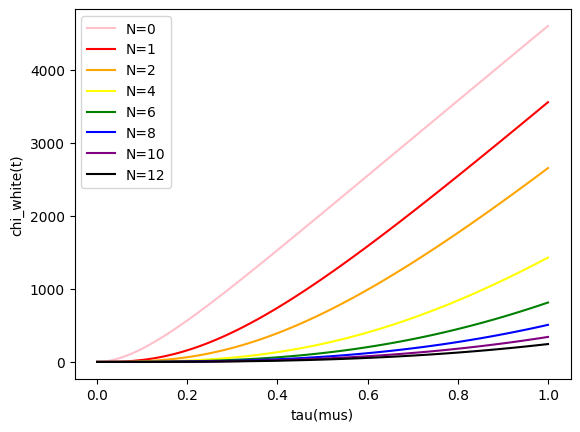

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)]), label = 'N=0', color='pink')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)]), label = 'N=1', color='red')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)]), label = 'N=2', color='orange')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)]), label = 'N=4', color='yellow')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)]), label = 'N=6', color='green')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)]), label = 'N=8', color='blue')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)]), label = 'N=10', color='purple')
ax.plot(tau_list, np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)]), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

Text(0, 0.5, 'chi_white(t)')

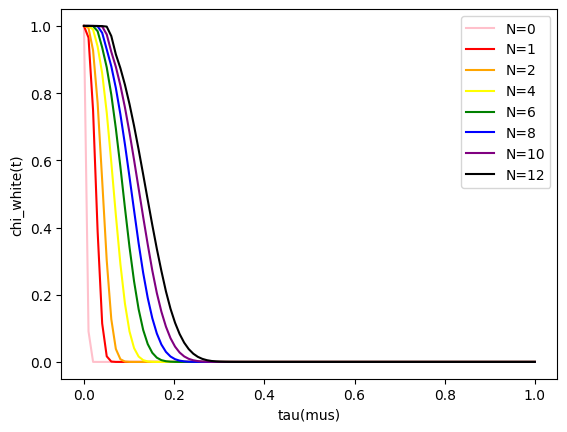

In [ ]:
# MHz Scale

tau_list = np.linspace(0,1,100)

kappa = 2*np.pi*3
n = 1
kai = 2*np.pi*10


fig, ax = plt.subplots(1, 1)
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 0) for tau in range(100)])), label = 'N=0', color='pink')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 1) for tau in range(100)])), label = 'N=1', color='red')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 2) for tau in range(100)])), label = 'N=2', color='orange')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 4) for tau in range(100)])), label = 'N=4', color='yellow')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 6) for tau in range(100)])), label = 'N=6', color='green')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 8) for tau in range(100)])), label = 'N=8', color='blue')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 10) for tau in range(100)])), label = 'N=10', color='purple')
ax.plot(tau_list, np.exp(-np.array([chi_N(0.01*tau, kappa, n, kai, 12) for tau in range(100)])), label = 'N=12', color='black')
ax.legend(loc = 0)
ax.set_xlabel('tau(mus)')
ax.set_ylabel('chi_white(t)')

## 2) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [3]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [4]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [5]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [6]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [7]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [8]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [9]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [10]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [11]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt_r'] # duration of the readout drive, in units of ns
    T_end = args['T_end_r'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

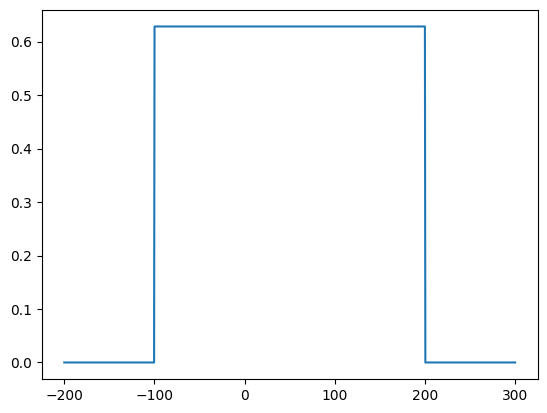

In [12]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt_r': -100, 'T_end_r': 200}))

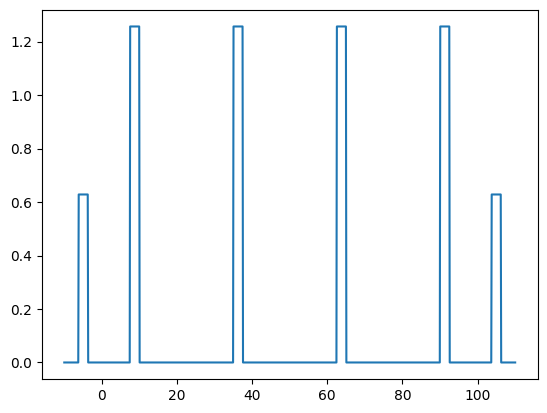

In [13]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt_q': -5, 'T_end_q': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

## 3) DD $n$=0.004

$\kappa = 2\pi0.002, 2\pi0.004, 2\pi0.006, 2\pi0.008, 2\pi0.010, 2\pi0.012, 2\pi0.014$

$N = 0, 1, 2, 4, 6, 8, 10$


In [14]:
A = [0.00126,0.00129,0.00135,0.00138,0.00142,0.00153,0.00153]
alpha = [-0.0062j,-0.0124j,-0.01857j,-0.02379j,-0.0284j,-0.0337j,-0.03594j]
kappa_seq = [0.002, 0.004, 0.006,0.008,0.010,0.012,0.014]
N_seq = [0,1,2,4,6,8,10]
tau_list = [50*(k+2) for k in range(19)]
n_exp = 0.004

z_tot = []
plus_tot = []

In [15]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite]

In [16]:
# iterate for kappa
for i in range(7):

  kappa = 2*np.pi*kappa_seq[i]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = -n_exp*kai*sz_composite + (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(7):

    z = []
    plus = []


    # iterate for evolution time 100ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      x_sub = result.expect[0]
      y_sub = result.expect[1]
      z_sub = result.expect[2]
      plus_sub = result.expect[3]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


0
1
2
3
4
5
6


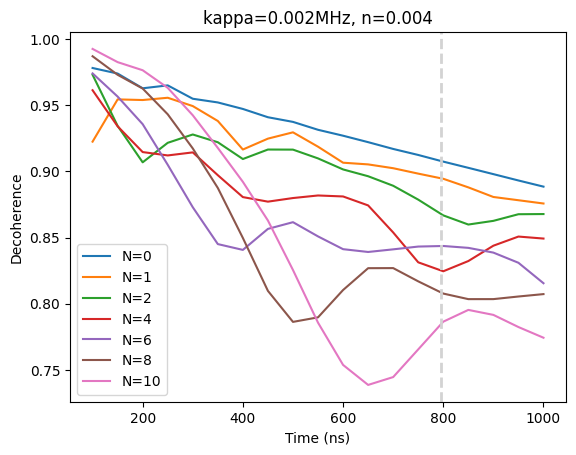

In [17]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[0]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

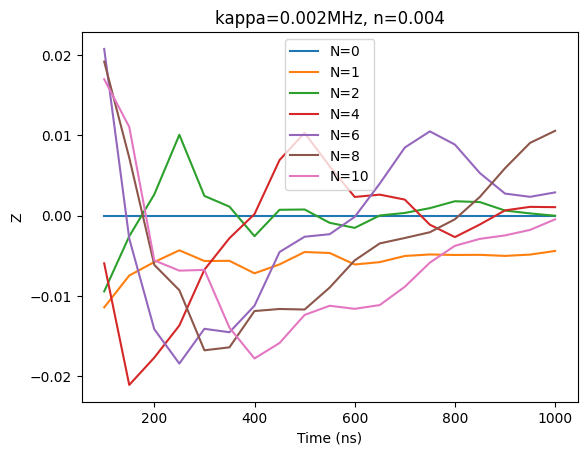

In [18]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

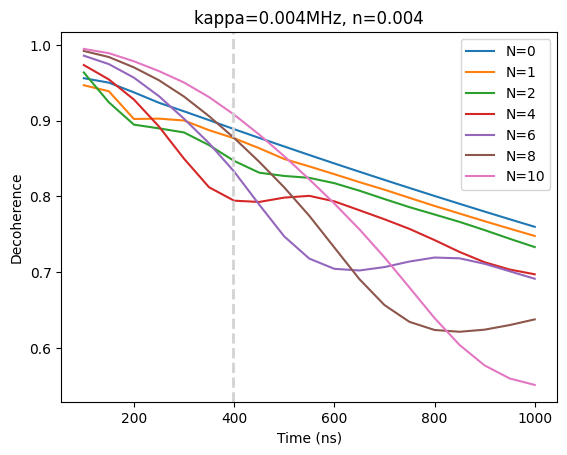

In [19]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[1]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

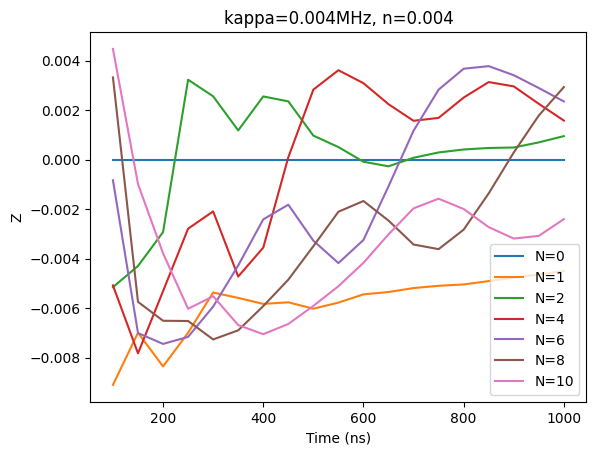

In [20]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

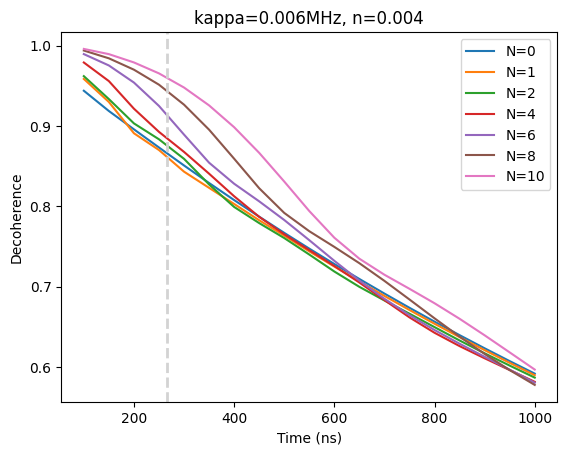

In [21]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[2]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

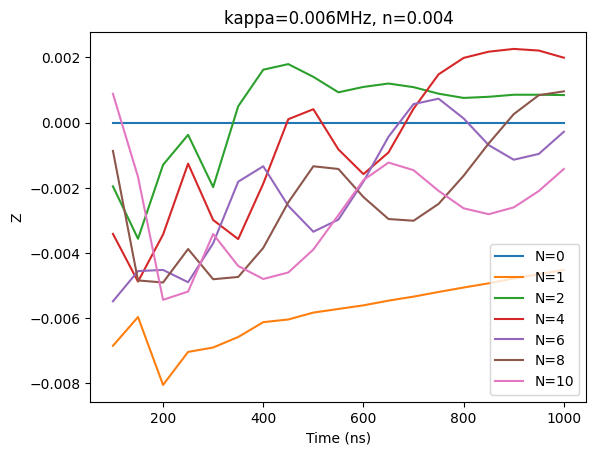

In [22]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

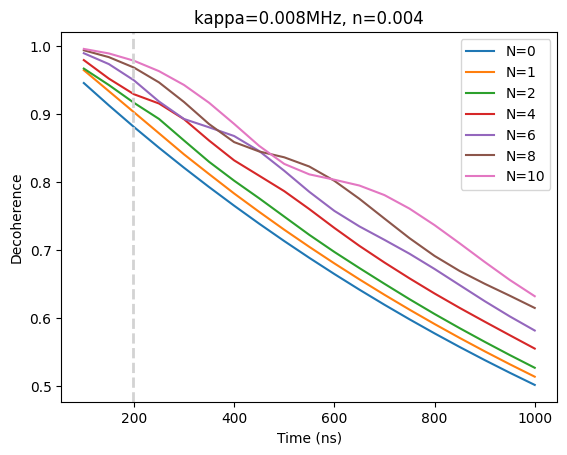

In [23]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[3]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

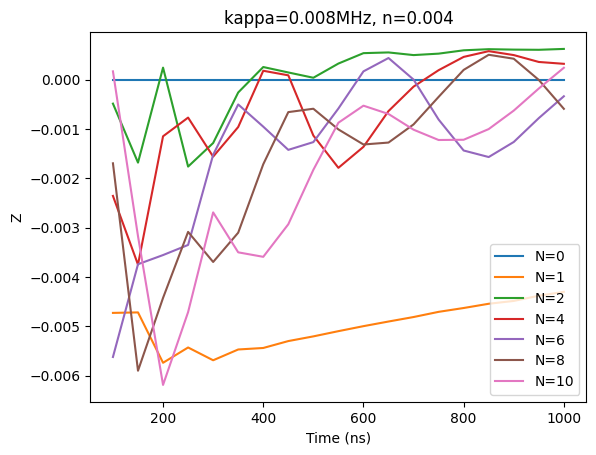

In [24]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

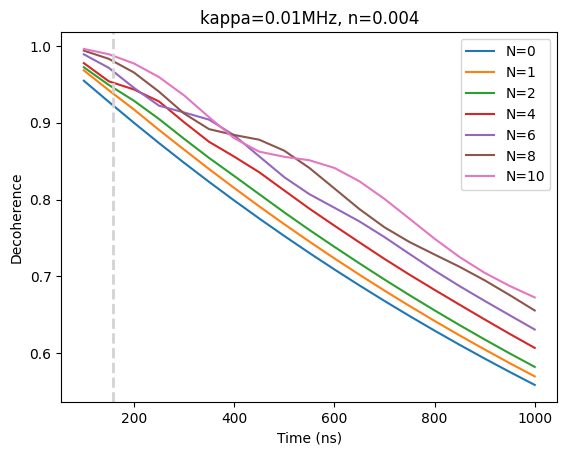

In [25]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[4]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

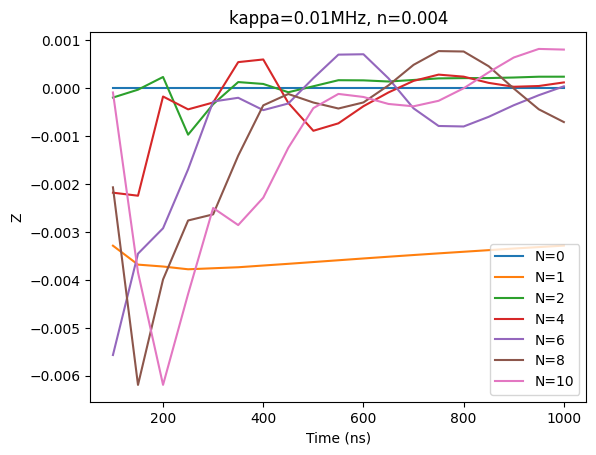

In [26]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

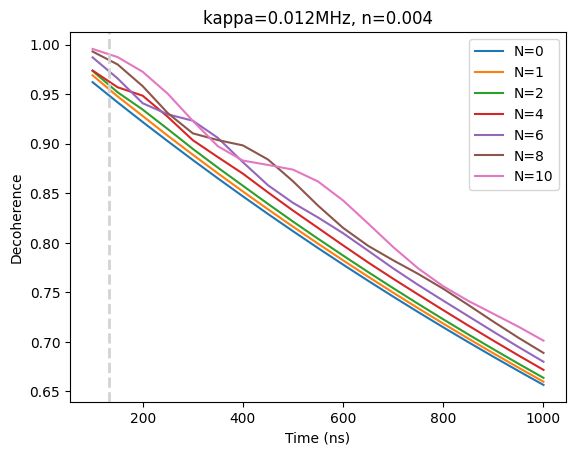

In [27]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[5]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

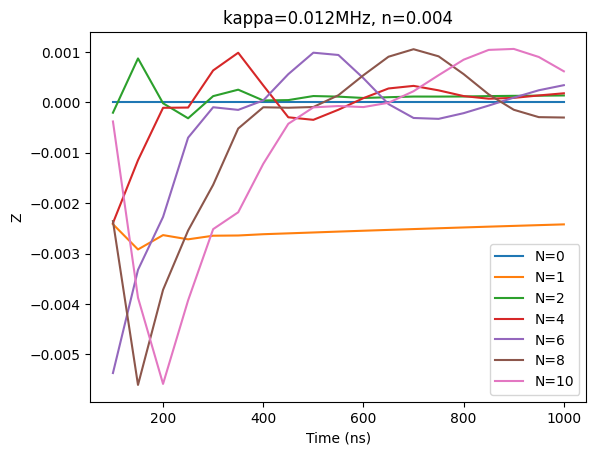

In [28]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

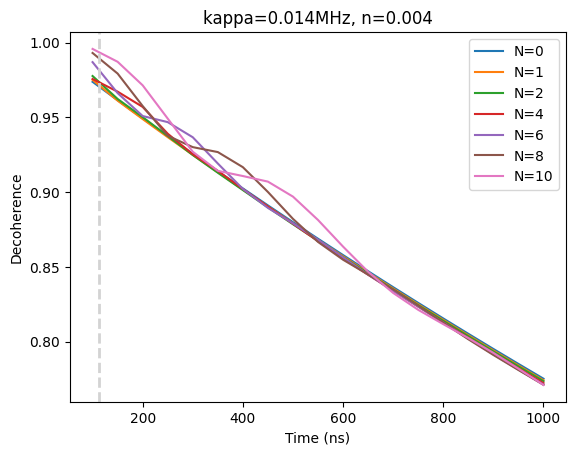

In [29]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[6]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

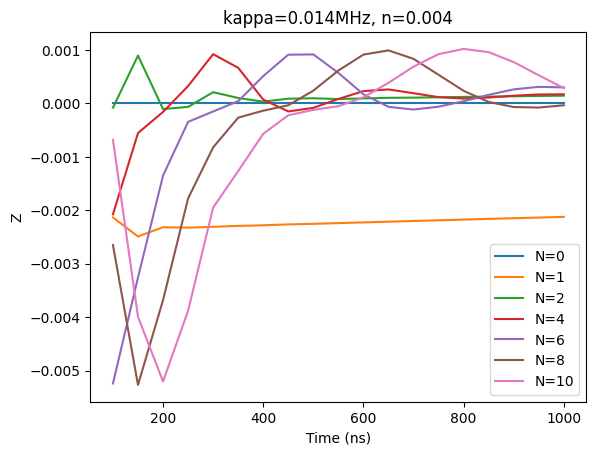

In [30]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

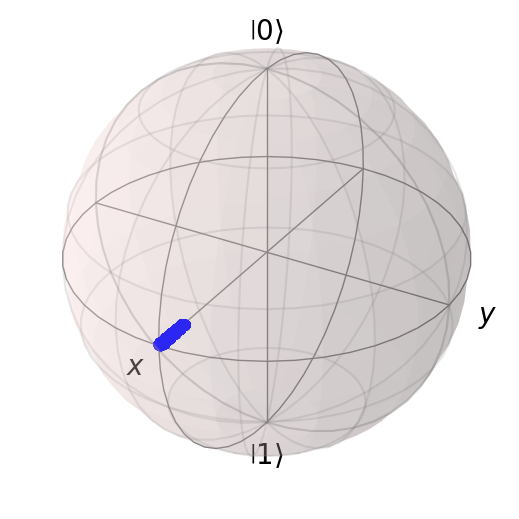

In [31]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([result.expect[0], result.expect[1], result.expect[2]]), meth="s")
sphere.show()

## 4) $n$=0.004 Dynamical Decoupling Estimation

In [32]:
# tau = 300ns
off_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(plus_tot[i][j][4])

  off_300.append(lst)

off_300

[[0.9548889654488277,
  0.9493578670490459,
  0.9278905636561184,
  0.9143679310096082,
  0.872933068523934,
  0.9173570878561798,
  0.942408131238714],
 [0.9124705826621056,
  0.9003304220392401,
  0.8845793664867307,
  0.8498939575851341,
  0.9026959669907775,
  0.9319631319994511,
  0.9505312929911783],
 [0.8507962112686295,
  0.8430823521591607,
  0.8590544406471613,
  0.8676678260946893,
  0.8891943705658235,
  0.9264516712818875,
  0.9477733134796701],
 [0.8213607805831845,
  0.841001646926974,
  0.8614356487945124,
  0.8927580742390812,
  0.893083715906624,
  0.9180668630140298,
  0.9431099359890034],
 [0.8479442739067139,
  0.8651086555142827,
  0.8791677272538851,
  0.9007723307786403,
  0.9134476394447382,
  0.9121207066710877,
  0.9357117144499307],
 [0.8836660489110175,
  0.8889688687329504,
  0.8948602819101389,
  0.9036356702588381,
  0.9232842203811378,
  0.9105266665565516,
  0.923130273612184],
 [0.9256001712622215,
  0.9249163736425752,
  0.9247898600670128,
  0.92532

In [33]:
# tau = 300ns, KHz
gamma_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(-(1000000/300)*np.log(plus_tot[i][j][4]))

  gamma_300.append(lst)

gamma_300

[[153.867372688719,
  173.2315078429706,
  249.47160081527662,
  298.4074606363246,
  452.9879814638915,
  287.5282458007691,
  197.72279299198607],
 [305.33144074555395,
  349.97815812151356,
  408.8101302223064,
  542.1456435420666,
  341.2315813540395,
  234.87341006494972,
  169.1139831086517],
 [538.6088293526797,
  568.968787858525,
  506.40994078029655,
  473.1544213228258,
  391.4647593659005,
  254.64465763981784,
  178.7997537436279],
 [655.9760854578809,
  577.2055357168709,
  497.18307500758823,
  378.1321610513307,
  376.9165189455592,
  284.95018495586396,
  195.24140677106175],
 [549.8012002739678,
  483.0005554254654,
  429.2652783717415,
  348.34246114799265,
  301.76407807451034,
  306.6098128659356,
  221.49282442677614],
 [412.25353481226284,
  392.3102079317696,
  370.29227497087794,
  337.7633981645852,
  266.0605360216845,
  312.44030809087445,
  266.61637643495135],
 [257.7097269145272,
  260.17317476517076,
  260.6291519484807,
  258.7146256221686,
  218.026750

In [34]:
# tau = 300ns
gamma_2_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(gamma_300[i][j]-0.5*kappa_seq[i]*1000000*0.01)

  gamma_2_300.append(lst)

gamma_2_300

[[143.867372688719,
  163.2315078429706,
  239.47160081527662,
  288.4074606363246,
  442.9879814638915,
  277.5282458007691,
  187.72279299198607],
 [285.33144074555395,
  329.97815812151356,
  388.8101302223064,
  522.1456435420666,
  321.2315813540395,
  214.87341006494972,
  149.1139831086517],
 [508.60882935267966,
  538.968787858525,
  476.40994078029655,
  443.1544213228258,
  361.4647593659005,
  224.64465763981784,
  148.7997537436279],
 [615.9760854578809,
  537.2055357168709,
  457.18307500758823,
  338.1321610513307,
  336.9165189455592,
  244.95018495586396,
  155.24140677106175],
 [499.80120027396777,
  433.0005554254654,
  379.2652783717415,
  298.34246114799265,
  251.76407807451034,
  256.6098128659356,
  171.49282442677614],
 [352.25353481226284,
  332.3102079317696,
  310.29227497087794,
  277.7633981645852,
  206.06053602168453,
  252.44030809087445,
  206.61637643495135],
 [187.7097269145272,
  190.17317476517076,
  190.62915194848068,
  188.71462562216863,
  148.0

In [35]:
# tau = 1000ns
off_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(plus_tot[i][j][18])

  off_1000.append(lst)

off_1000

[[0.8884943210392622,
  0.8757536694093601,
  0.8677872033372162,
  0.8492739527896386,
  0.8155282120102534,
  0.8073120507076637,
  0.7743656277885616],
 [0.7599120798067259,
  0.7478365095849072,
  0.7331834859246865,
  0.6972017050224723,
  0.6913359077324147,
  0.6376402059382206,
  0.551061112932441],
 [0.5917760622180401,
  0.5897817382152184,
  0.5867924900659652,
  0.5815858647746143,
  0.5804410603931448,
  0.57770123731848,
  0.5968210827214303],
 [0.5018270265373664,
  0.513930860874898,
  0.5270436834112912,
  0.5552826863468037,
  0.5818607377035986,
  0.6150643278638226,
  0.6323223918832785],
 [0.5586206304830611,
  0.5697116675399948,
  0.582077221933961,
  0.6068370180809316,
  0.630758375963083,
  0.6555782226607312,
  0.6725714679833189],
 [0.6566062819427806,
  0.6598566654542353,
  0.6637464728433531,
  0.6718056289433807,
  0.68000757371956,
  0.68891867923827,
  0.7013021999260363],
 [0.7751352406475466,
  0.7740879507624838,
  0.7734501728563745,
  0.7721996232

In [36]:
# tau = 1000ns, KHz
gamma_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(-(1000000/1000)*np.log(plus_tot[i][j][18]))

  gamma_1000.append(lst)

gamma_1000

[[118.2270230350245,
  132.67042689406682,
  141.80875182338937,
  163.37346770022498,
  203.91926277971834,
  214.0450055184606,
  255.71112960845355],
 [274.5525368585584,
  290.570894971233,
  310.3592865589929,
  360.68051981075854,
  369.12945505032843,
  449.98109524732394,
  595.9095632165375],
 [524.6269889418539,
  528.002745753732,
  533.0840309104673,
  541.9966570908192,
  543.9670154827785,
  548.6984343961376,
  516.1379044406891],
 [689.4997873184899,
  665.666534491052,
  640.4718431525083,
  588.2779501387038,
  541.5241421794979,
  486.0284184930674,
  458.3559011596987],
 [582.2846936735258,
  562.6248925580655,
  541.1521563170793,
  499.4950279615734,
  460.83241217841777,
  422.2376500822158,
  396.64690105846734],
 [420.6707065787783,
  415.73264110144595,
  409.85502042375657,
  397.7862229414876,
  385.6513430511274,
  372.6320421646175,
  354.81638651843133],
 [254.71776079150226,
  256.0697803718998,
  256.89402881202994,
  258.51218300426154,
  259.785543664

In [37]:
# tau = 1000ns
gamma_2_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(gamma_1000[i][j]-0.5*kappa_seq[i]*1000000*0.01)

  gamma_2_1000.append(lst)

gamma_2_1000

[[108.2270230350245,
  122.67042689406682,
  131.80875182338937,
  153.37346770022498,
  193.91926277971834,
  204.0450055184606,
  245.71112960845355],
 [254.55253685855843,
  270.570894971233,
  290.3592865589929,
  340.68051981075854,
  349.12945505032843,
  429.98109524732394,
  575.9095632165375],
 [494.62698894185394,
  498.00274575373203,
  503.0840309104673,
  511.9966570908192,
  513.9670154827785,
  518.6984343961376,
  486.1379044406891],
 [649.4997873184899,
  625.666534491052,
  600.4718431525083,
  548.2779501387038,
  501.52414217949786,
  446.0284184930674,
  418.3559011596987],
 [532.2846936735258,
  512.6248925580655,
  491.1521563170793,
  449.4950279615734,
  410.83241217841777,
  372.2376500822158,
  346.64690105846734],
 [360.6707065787783,
  355.73264110144595,
  349.85502042375657,
  337.7862229414876,
  325.6513430511274,
  312.6320421646175,
  294.81638651843133],
 [184.71776079150226,
  186.0697803718998,
  186.89402881202994,
  188.51218300426154,
  189.7855

## 5) DD $n$=0.01

$\kappa = 2\pi0.002, 2\pi0.004, 2\pi0.006, 2\pi0.008, 2\pi0.010, 2\pi0.012, 2\pi0.014$

$N = 0, 1, 2, 4, 6, 8, 10$


In [38]:
A = [0.00201,0.00201,0.00207,0.00213,0.00224,0.00234,0.00244]
alpha = [-0.0099j,-0.0193j,-0.02848j,-0.03672j,-0.0448j,-0.051617j,-0.0573j]
kappa_seq = [0.002, 0.004, 0.006,0.008,0.010,0.012,0.014]
N_seq = [0,1,2,4,6,8,10]
tau_list = [50*(k+2) for k in range(19)]
n_exp = 0.01

z_tot = []
plus_tot = []

In [39]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite]

In [40]:
# iterate for kappa
for i in range(7):

  kappa = 2*np.pi*kappa_seq[i]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = -n_exp*kai*sz_composite + (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(7):

    z = []
    plus = []


    # iterate for evolution time 100ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      x_sub = result.expect[0]
      y_sub = result.expect[1]
      z_sub = result.expect[2]
      plus_sub = result.expect[3]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


0
1
2
3
4
5
6


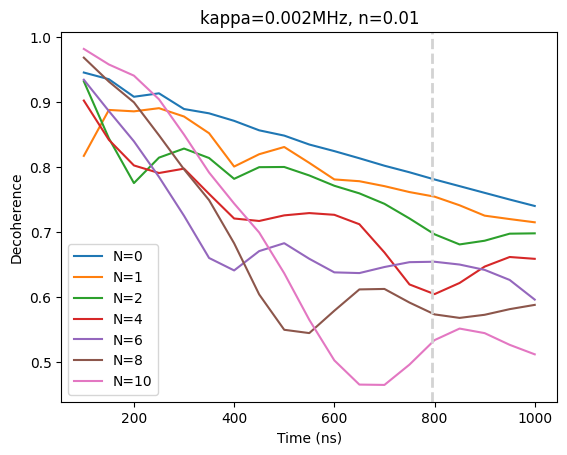

In [41]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[0]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

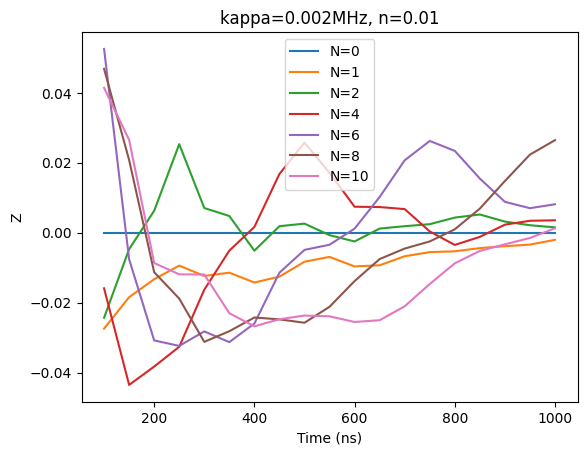

In [42]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

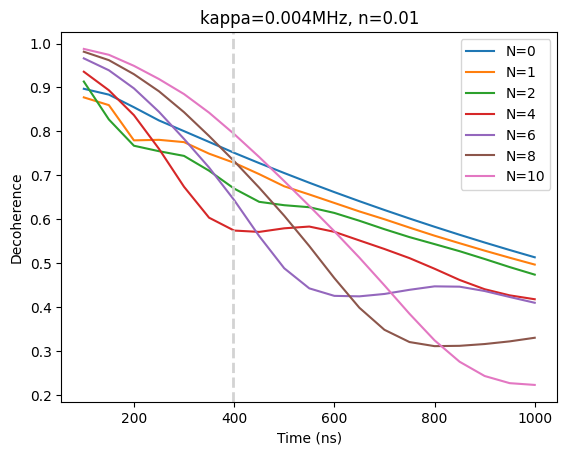

In [43]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[1]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

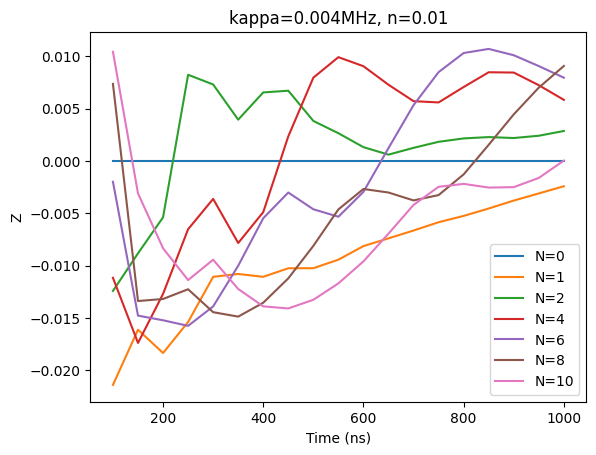

In [44]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

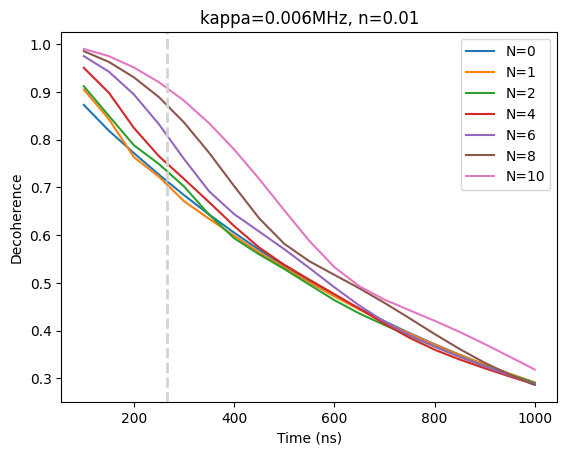

In [45]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[2]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

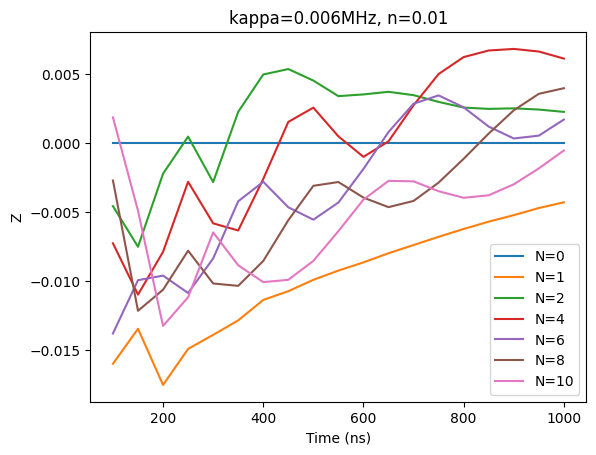

In [46]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

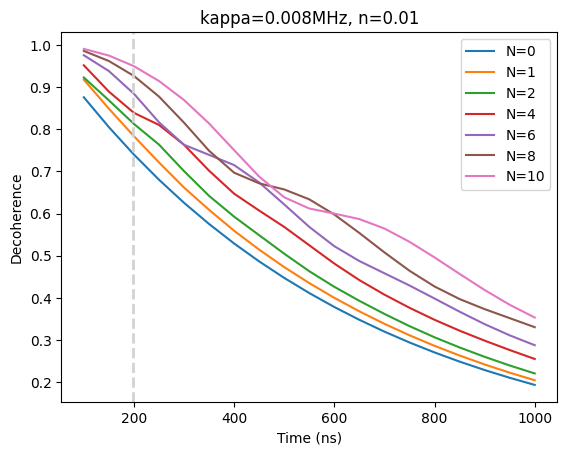

In [47]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[3]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

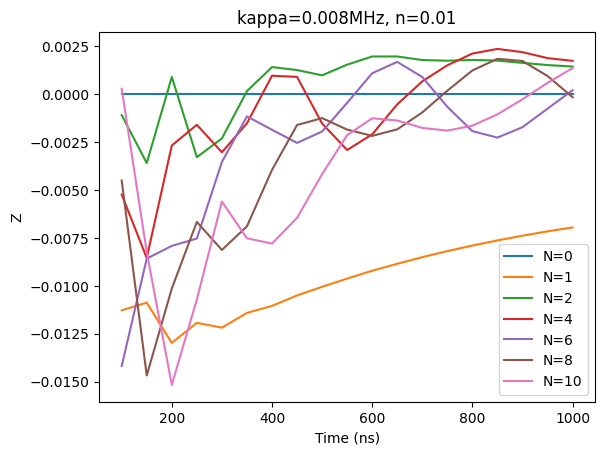

In [48]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

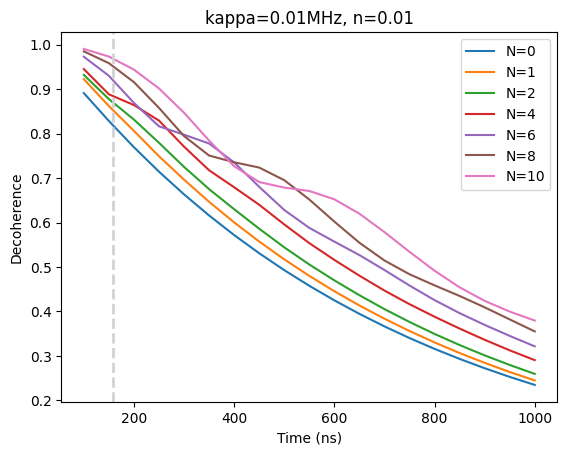

In [49]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[4]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

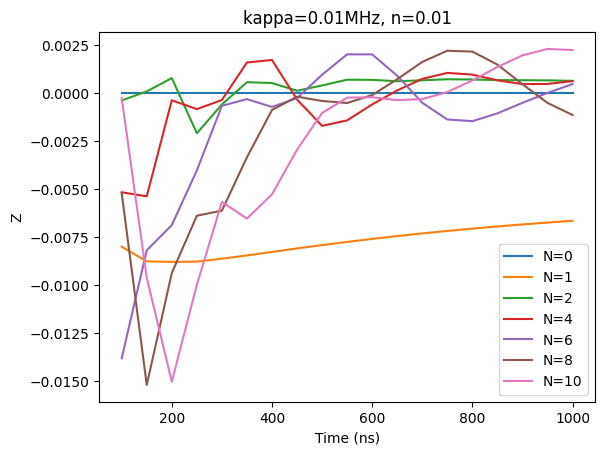

In [50]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

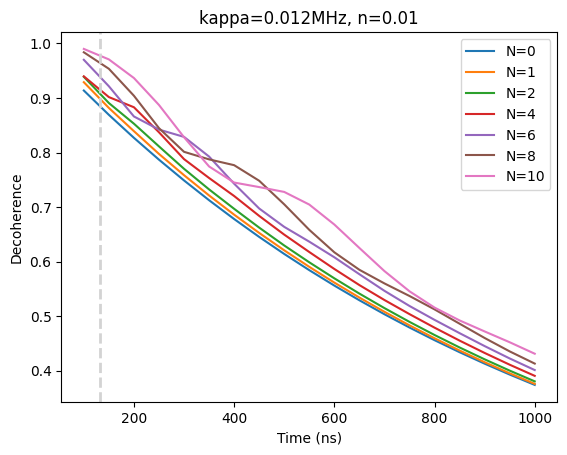

In [51]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[5]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

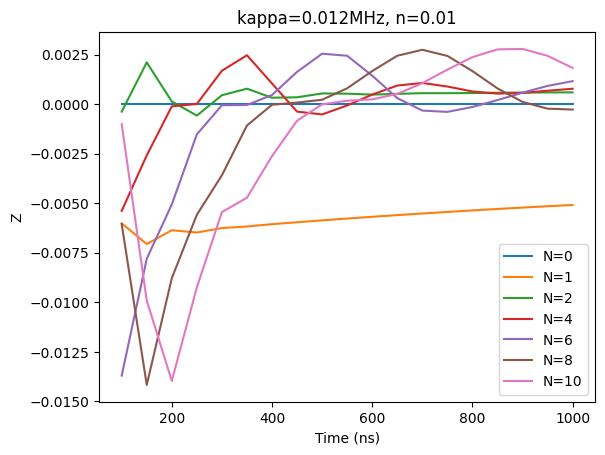

In [52]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

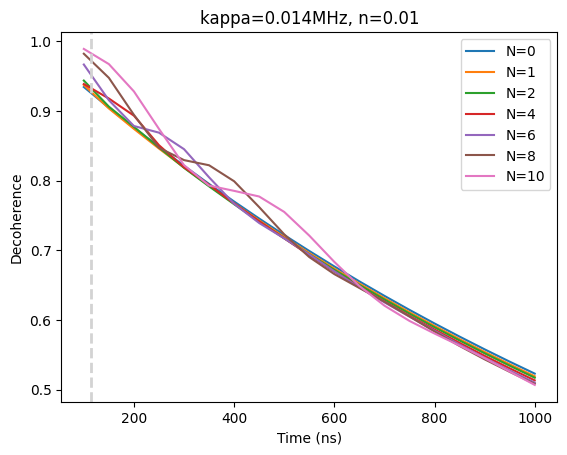

In [53]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')
plt.axvline(10/(2*np.pi*kappa_seq[6]), 0, 1.0, color='lightgray', linestyle='--', linewidth=2)

Text(0, 0.5, 'Z')

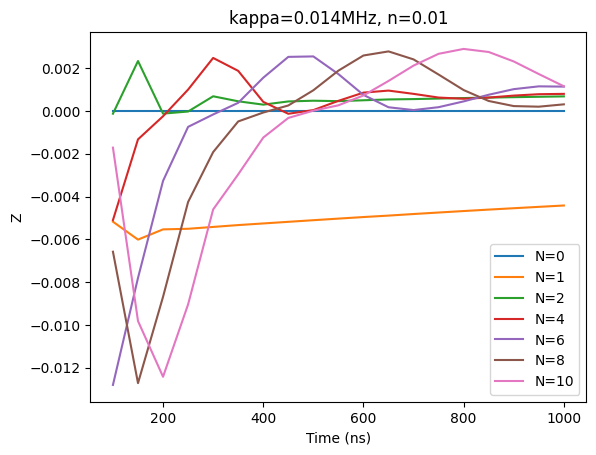

In [54]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

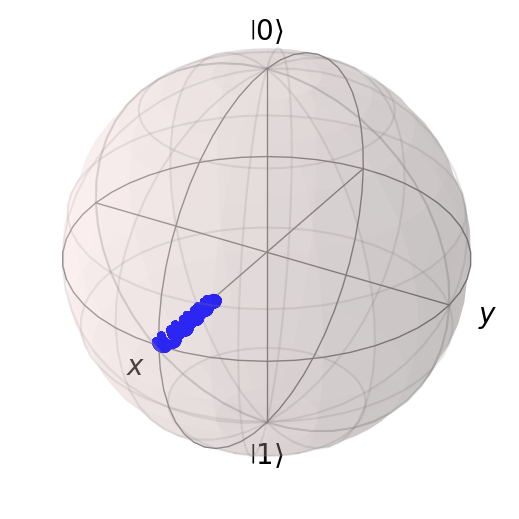

In [55]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([result.expect[0], result.expect[1], result.expect[2]]), meth="s")
sphere.show()

## 6) $n$=0.01 Dynamical Decoupling Estimation

In [56]:
# tau = 300ns
off_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(plus_tot[i][j][4])

  off_300.append(lst)

off_300

[[0.8891685273474148,
  0.8776673874492023,
  0.8284130133937397,
  0.7975417034756954,
  0.7250967508471127,
  0.7965139485441077,
  0.8498568909600273],
 [0.8006093567230601,
  0.7756100444996736,
  0.7442608849257134,
  0.6740048846276092,
  0.7829220599466272,
  0.8437698866750533,
  0.8849836346604645],
 [0.6839296954577538,
  0.6711941881618904,
  0.7021293650823375,
  0.7178552603613925,
  0.7597029962478695,
  0.8361408231927028,
  0.8817934456545797],
 [0.6257372657548083,
  0.6618758900389548,
  0.7009050237342859,
  0.7633697103738305,
  0.7633247135320245,
  0.8158328844508071,
  0.8695734203485714],
 [0.6633603972249467,
  0.6964966304014014,
  0.7251836505423426,
  0.770726495562955,
  0.7975272841320865,
  0.794497413138097,
  0.8469900180530283],
 [0.7487825240753346,
  0.7584150435978366,
  0.7701329912653632,
  0.7878835342842773,
  0.8286495616851431,
  0.8012820157730017,
  0.827996627191799],
 [0.8214970011102157,
  0.8191869581704787,
  0.8185947457393886,
  0.819

In [57]:
# tau = 300ns, KHz
gamma_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(-(1000000/300)*np.log(plus_tot[i][j][4]))

  gamma_300.append(lst)

gamma_300

[[391.56163954875797,
  434.95862301886086,
  627.4781350463697,
  754.0705097695447,
  1071.5006119558464,
  758.3687916298026,
  542.2910241631713],
 [741.2738178449554,
  847.0180169301465,
  984.5455127704683,
  1315.0597362470628,
  815.7404274794925,
  566.2515589349852,
  407.28708684754895],
 [1266.333836869185,
  1328.9892758114372,
  1178.7920372995534,
  1104.9577249858405,
  916.0923883083132,
  596.5274376274722,
  419.32479667342596],
 [1562.7489974972855,
  1375.5907263457902,
  1184.6096265123263,
  900.042722419603,
  900.2392116061509,
  678.4858115308264,
  465.8416967293193],
 [1368.1228364246545,
  1205.64107891924,
  1071.101150374713,
  868.072360734479,
  754.130776101686,
  766.8184965759514,
  553.5545648696226],
 [964.3556422190336,
  921.7483075681455,
  870.6402103968111,
  794.6833305975125,
  626.526457877514,
  738.4743808751025,
  629.1539934834337],
 [655.4233067212942,
  664.8098167522461,
  667.2204451263328,
  663.793668775683,
  559.8090498771088,


In [58]:
# tau = 300ns
gamma_2_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(gamma_300[i][j]-0.5*kappa_seq[i]*1000000*0.01)

  gamma_2_300.append(lst)

gamma_2_300

[[381.56163954875797,
  424.95862301886086,
  617.4781350463697,
  744.0705097695447,
  1061.5006119558464,
  748.3687916298026,
  532.2910241631713],
 [721.2738178449554,
  827.0180169301465,
  964.5455127704683,
  1295.0597362470628,
  795.7404274794925,
  546.2515589349852,
  387.28708684754895],
 [1236.333836869185,
  1298.9892758114372,
  1148.7920372995534,
  1074.9577249858405,
  886.0923883083132,
  566.5274376274722,
  389.32479667342596],
 [1522.7489974972855,
  1335.5907263457902,
  1144.6096265123263,
  860.042722419603,
  860.2392116061509,
  638.4858115308264,
  425.8416967293193],
 [1318.1228364246545,
  1155.64107891924,
  1021.1011503747129,
  818.072360734479,
  704.130776101686,
  716.8184965759514,
  503.5545648696226],
 [904.3556422190336,
  861.7483075681455,
  810.6402103968111,
  734.6833305975125,
  566.526457877514,
  678.4743808751025,
  569.1539934834337],
 [585.4233067212942,
  594.8098167522461,
  597.2204451263328,
  593.793668775683,
  489.8090498771088,

In [59]:
# tau = 1000ns
off_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(plus_tot[i][j][18])

  off_1000.append(lst)

off_1000

[[0.7401792481358749,
  0.7150978503755636,
  0.6981339189606786,
  0.6589653528519117,
  0.5963098757486552,
  0.588198970427345,
  0.5122160174103296],
 [0.5134742200737996,
  0.4968941803582865,
  0.4739902779601836,
  0.417980955672315,
  0.40994061212670124,
  0.33031307421665806,
  0.22295673005223335],
 [0.29128368903574337,
  0.2914041383997714,
  0.2903189363978856,
  0.28729068072164365,
  0.2876674888819348,
  0.28635967531136786,
  0.31857683188201097],
 [0.19347381538856456,
  0.2045961482184929,
  0.22071352145083642,
  0.25508750628118937,
  0.28770729825937835,
  0.3304901556822899,
  0.35344710026429665],
 [0.234815616675058,
  0.2448388134682651,
  0.25966016010274057,
  0.29057515687859875,
  0.32156746817112203,
  0.355126591785968,
  0.37959215158386705],
 [0.37381026561078995,
  0.37576596601188555,
  0.3803466146353676,
  0.39043914681646796,
  0.40106023024193804,
  0.4129205592469949,
  0.4310363108581675],
 [0.5231851331993133,
  0.5193667749968804,
  0.517283

In [60]:
# tau = 1000ns, KHz
gamma_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(-(1000000/1000)*np.log(plus_tot[i][j][18]))

  gamma_1000.append(lst)

gamma_1000

[[300.86289490555407,
  335.3358919796219,
  359.34433364754346,
  417.08432120028687,
  516.9948212785732,
  530.6900032423105,
  669.0088339166568],
 [666.5554552091504,
  699.3781923396366,
  746.5684681299305,
  872.3194080878438,
  891.742978246797,
  1107.7143645148285,
  1500.7775619895779],
 [1233.457610282554,
  1233.0441835381728,
  1236.775179634992,
  1247.260750969418,
  1245.9500183486505,
  1250.5066523025123,
  1143.8916026625147],
 [1642.613096658342,
  1586.71725155339,
  1510.8897013938943,
  1366.1486308032672,
  1245.8116411434034,
  1107.178406269292,
  1040.0214504890903],
 [1448.954682698791,
  1407.1551891625172,
  1348.3815794641434,
  1235.8930205622978,
  1134.5479029782796,
  1035.2809564919792,
  968.6578879504448],
 [984.0069214945668,
  978.7887602021766,
  966.6722982347608,
  940.4831558625058,
  913.6436628498905,
  884.5000550143704,
  841.5629444962638],
 [647.8198943817931,
  655.144949845584,
  659.1649170278492,
  666.5377873153618,
  672.8634510

In [61]:
# tau = 1000ns
gamma_2_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(gamma_1000[i][j]-0.5*kappa_seq[i]*1000000*0.01)

  gamma_2_1000.append(lst)

gamma_2_1000

[[290.86289490555407,
  325.3358919796219,
  349.34433364754346,
  407.08432120028687,
  506.9948212785732,
  520.6900032423105,
  659.0088339166568],
 [646.5554552091504,
  679.3781923396366,
  726.5684681299305,
  852.3194080878438,
  871.742978246797,
  1087.7143645148285,
  1480.7775619895779],
 [1203.457610282554,
  1203.0441835381728,
  1206.775179634992,
  1217.260750969418,
  1215.9500183486505,
  1220.5066523025123,
  1113.8916026625147],
 [1602.613096658342,
  1546.71725155339,
  1470.8897013938943,
  1326.1486308032672,
  1205.8116411434034,
  1067.178406269292,
  1000.0214504890903],
 [1398.954682698791,
  1357.1551891625172,
  1298.3815794641434,
  1185.8930205622978,
  1084.5479029782796,
  985.2809564919792,
  918.6578879504448],
 [924.0069214945668,
  918.7887602021766,
  906.6722982347608,
  880.4831558625058,
  853.6436628498905,
  824.5000550143704,
  781.5629444962638],
 [577.8198943817931,
  585.144949845584,
  589.1649170278492,
  596.5377873153618,
  602.86345105

## 7) DD $n$=0.04

$\kappa = 2\pi0.002, 2\pi0.004, 2\pi0.006, 2\pi0.008, 2\pi0.010, 2\pi0.012, 2\pi0.014$

$N = 0, 1, 2, 4, 6, 8, 10$


In [77]:
A = [0.00402,0.00405,0.00414,0.00429,0.00447,0.00457,0.00482]
alpha = [-0.0198j,-0.0894j,-0.05697j,-0.07396j,-0.0894j,-0.1008j,-0.1132j]
kappa_seq = [0.002,0.004,0.006,0.008,0.010,0.012,0.014]
N_seq = [0,1,2,4,6,8,10]
tau_list = [50*(k+2) for k in range(19)]
n_exp = 0.04

z_tot = []
plus_tot = []

In [78]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite]

In [79]:
# iterate for kappa
for i in range(7):

  kappa = 2*np.pi*kappa_seq[i]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = -n_exp*kai*sz_composite + (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(7):

    z = []
    plus = []


    # iterate for evolution time 100ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      x_sub = result.expect[0]
      y_sub = result.expect[1]
      z_sub = result.expect[2]
      plus_sub = result.expect[3]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6


Text(0, 0.5, 'Decoherence')

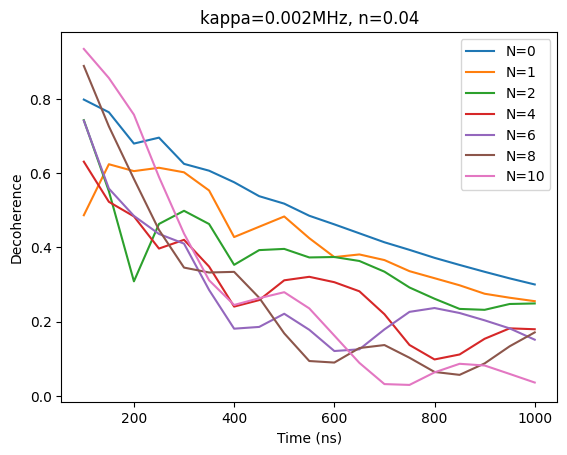

In [80]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

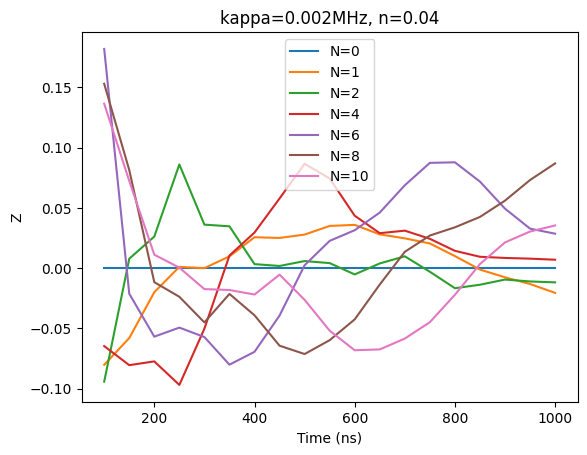

In [81]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

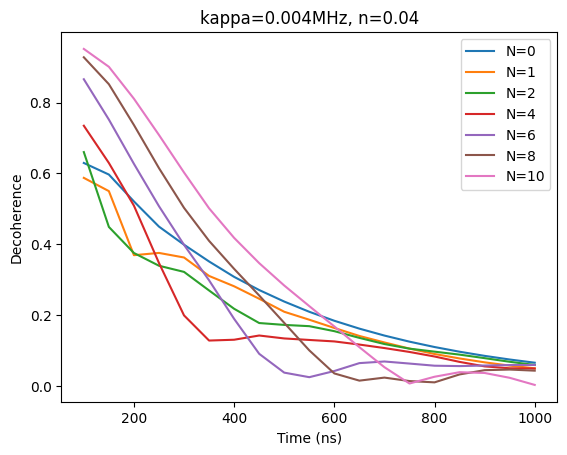

In [82]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

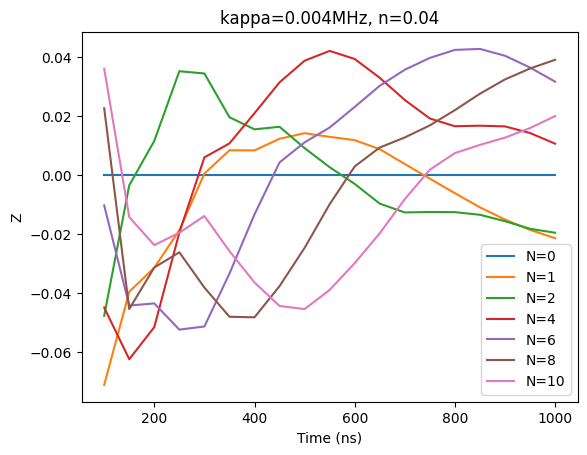

In [83]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

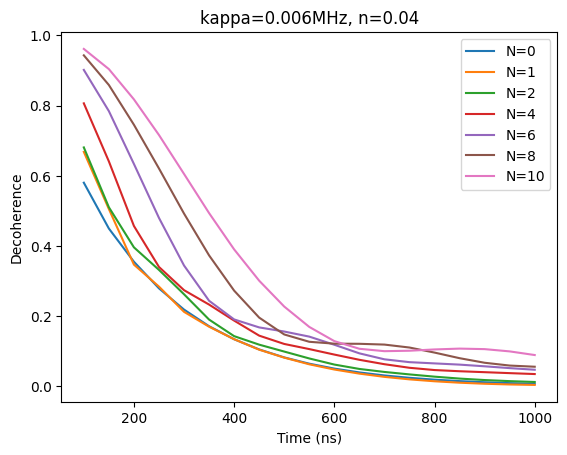

In [84]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

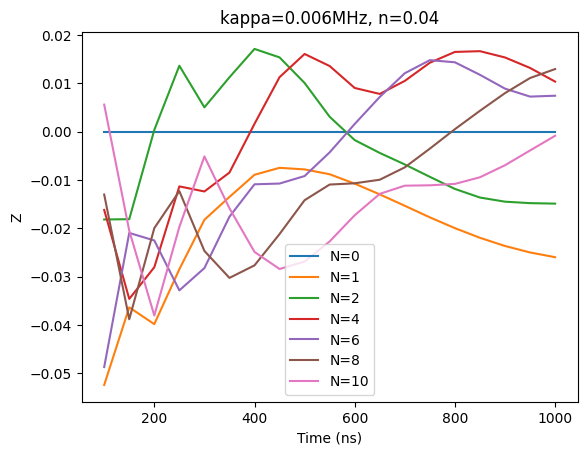

In [85]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

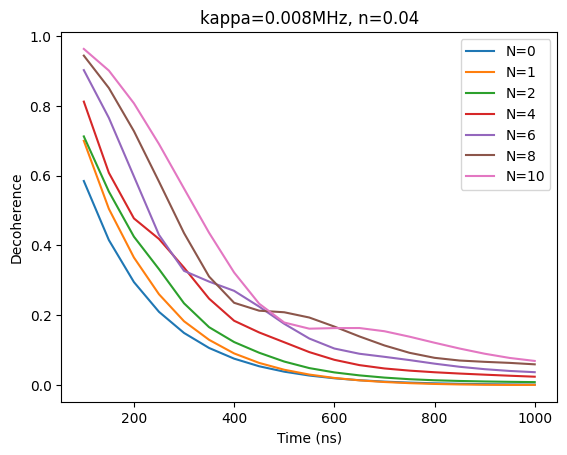

In [86]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

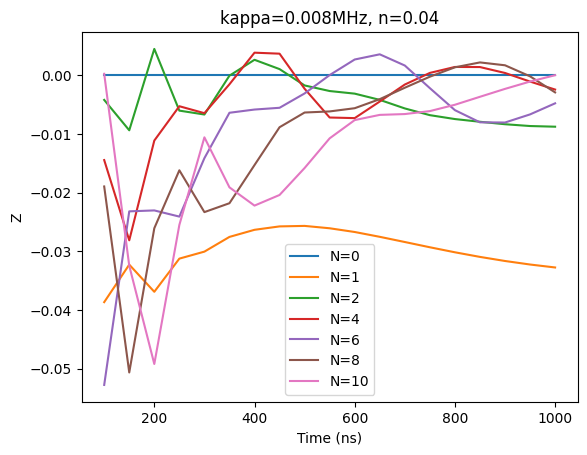

In [87]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

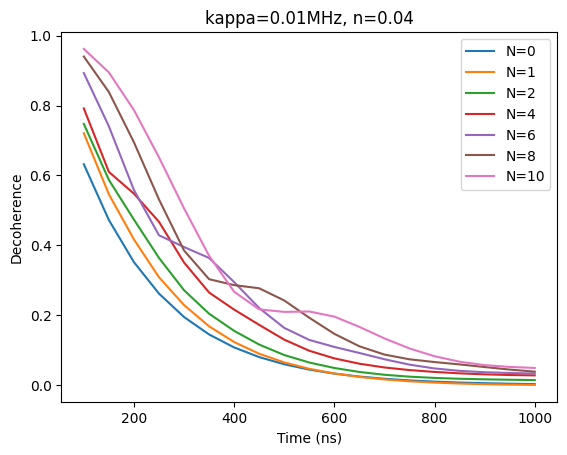

In [88]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

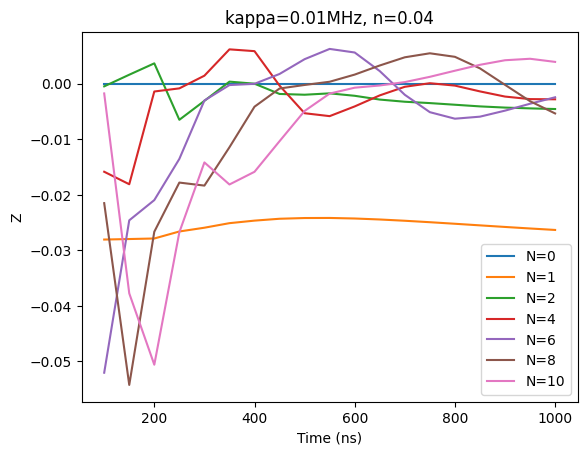

In [89]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

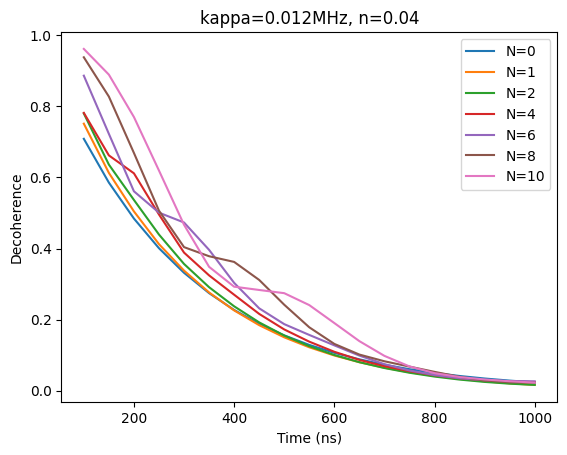

In [90]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

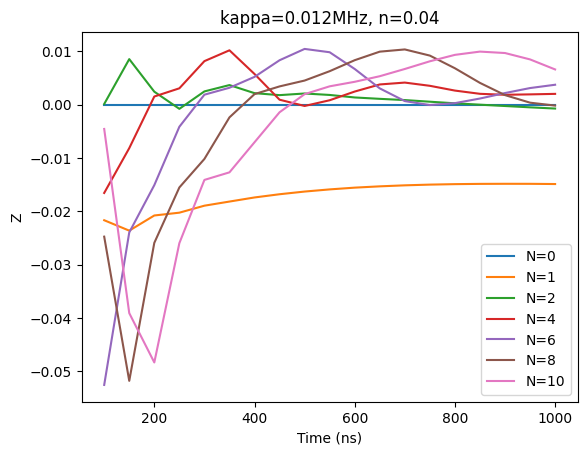

In [91]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

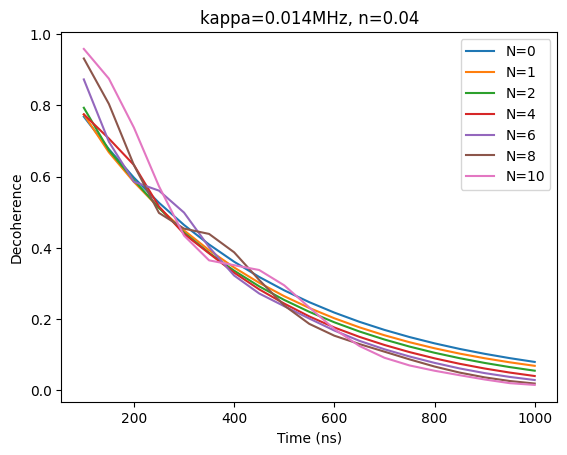

In [92]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

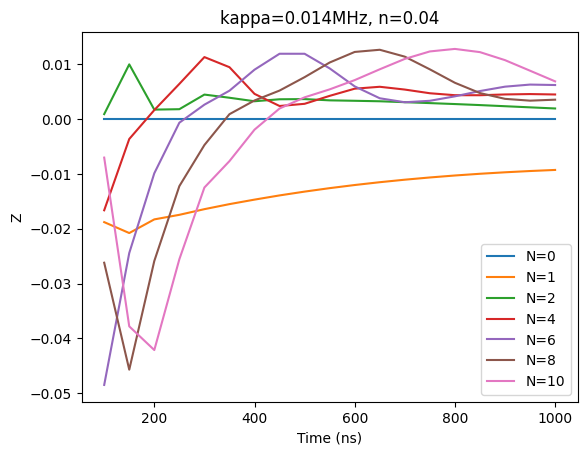

In [93]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

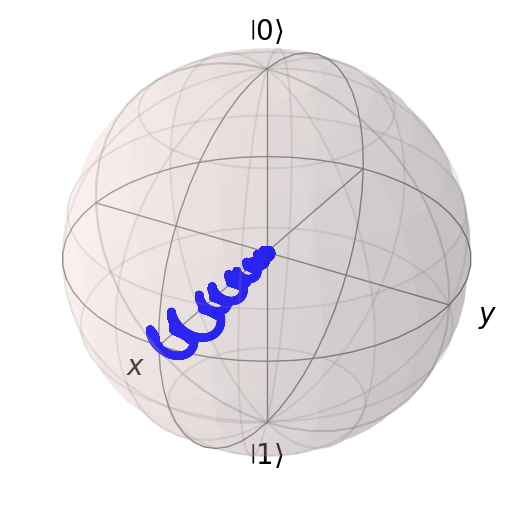

In [94]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([result.expect[0], result.expect[1], result.expect[2]]), meth="s")
sphere.show()

## 8) $n$=0.04 Dynamical Decoupling Estimation

In [95]:
# tau = 300ns
off_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(plus_tot[i][j][4])

  off_300.append(lst)

off_300

[[0.6250806504710812,
  0.6023364939622955,
  0.4986394539433975,
  0.4204940895810578,
  0.41017967937502975,
  0.34560904360320255,
  0.43721725683051726],
 [0.3988465790319894,
  0.3627465273171126,
  0.32209498147441395,
  0.19926394825351998,
  0.3984313229284127,
  0.5028851115688786,
  0.6027437559328457],
 [0.2188088592608762,
  0.21237297712209482,
  0.26245459441116914,
  0.2741434273974961,
  0.344448704230813,
  0.4924444504715476,
  0.6054017849817983],
 [0.14929660247751245,
  0.18284247383120497,
  0.23420827579567158,
  0.33649320148470024,
  0.32724853668663806,
  0.4354984502756276,
  0.5632112304315684],
 [0.1950497732001744,
  0.22924055734109228,
  0.2717410149589149,
  0.35110340920881167,
  0.39532989525239637,
  0.3854602487006751,
  0.5060526475028986],
 [0.3317236328893002,
  0.33784660505602104,
  0.35663290960790195,
  0.38857991029194383,
  0.4732486982974032,
  0.4039506118357562,
  0.4668909565764062],
 [0.46427033555387426,
  0.44906785511265257,
  0.442

In [96]:
# tau = 300ns, KHz
gamma_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(-(1000000/300)*np.log(plus_tot[i][j][4]))

  gamma_300.append(lst)

gamma_300

[[1566.2486560568252,
  1689.7967658768302,
  2319.5732719133216,
  2887.749517870005,
  2970.5332430193557,
  3541.4902485375587,
  2757.7501740289445],
 [3063.9281658030363,
  3380.169868254365,
  3776.3626780361346,
  5377.083199933938,
  3067.400448513205,
  2291.311804649394,
  1687.5437375766235],
 [5065.18906343545,
  5164.704080212661,
  4458.923951946221,
  4313.679506317128,
  3552.7003293329203,
  2361.2453855069443,
  1672.8764465503514],
 [6339.401103473738,
  5663.76765192427,
  4838.481639989197,
  3630.5911123767983,
  3723.451152493073,
  2770.8801373015053,
  1913.6684464671687],
 [5448.3350193600945,
  4909.944526819002,
  4343.019390520267,
  3488.9149525856,
  3093.448949312693,
  3177.7240250218483,
  2270.381895529039],
 [3678.1769592836686,
  3617.211059022891,
  3436.827635442199,
  3150.8548034280843,
  2493.780798188833,
  3021.542188083903,
  2538.8651542437747],
 [2557.627588948949,
  2668.6042589520366,
  2716.162733465415,
  2742.7636922517077,
  2317.547

In [97]:
# tau = 300ns
gamma_2_300 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(gamma_300[i][j]-0.5*kappa_seq[i]*1000000*0.01)

  gamma_2_300.append(lst)

gamma_2_300

[[1556.2486560568252,
  1679.7967658768302,
  2309.5732719133216,
  2877.749517870005,
  2960.5332430193557,
  3531.4902485375587,
  2747.7501740289445],
 [3043.9281658030363,
  3360.169868254365,
  3756.3626780361346,
  5357.083199933938,
  3047.400448513205,
  2271.311804649394,
  1667.5437375766235],
 [5035.18906343545,
  5134.704080212661,
  4428.923951946221,
  4283.679506317128,
  3522.7003293329203,
  2331.2453855069443,
  1642.8764465503514],
 [6299.401103473738,
  5623.76765192427,
  4798.481639989197,
  3590.5911123767983,
  3683.451152493073,
  2730.8801373015053,
  1873.6684464671687],
 [5398.3350193600945,
  4859.944526819002,
  4293.019390520267,
  3438.9149525856,
  3043.448949312693,
  3127.7240250218483,
  2220.381895529039],
 [3618.1769592836686,
  3557.211059022891,
  3376.827635442199,
  3090.8548034280843,
  2433.780798188833,
  2961.542188083903,
  2478.8651542437747],
 [2487.627588948949,
  2598.6042589520366,
  2646.162733465415,
  2672.7636922517077,
  2247.547

In [98]:
# tau = 1000ns
off_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(plus_tot[i][j][18])

  off_1000.append(lst)

off_1000

[[0.3001569459605926,
  0.2551218644722474,
  0.24898483259908633,
  0.17949445500293282,
  0.15138240908618952,
  0.17104162143337986,
  0.035927738154108],
 [0.06570108501454365,
  0.0498109053886279,
  0.05932479915193698,
  0.049226196497464396,
  0.05931656677595586,
  0.04323303025219618,
  0.0029757127180461093],
 [0.007200105483028821,
  0.004106203185017758,
  0.012476549572960965,
  0.03510193868387403,
  0.047368998578689404,
  0.05594833476383993,
  0.08927567420241547],
 [0.0012764251669108936,
  0.0004432995239838632,
  0.008380232024039485,
  0.023914299520376013,
  0.0368407180727583,
  0.059340782754552575,
  0.06908413008988588],
 [0.003118661581558414,
  0.0007408010284151768,
  0.0146023720021742,
  0.0279975160404574,
  0.03351697908980799,
  0.03880691915700329,
  0.04929505503906911],
 [0.023444421664010565,
  0.01622658815567499,
  0.016200786551165847,
  0.02449319519982386,
  0.026299187333170115,
  0.022538408364105023,
  0.02274286623730192],
 [0.07982239608

In [99]:
# tau = 1000ns, KHz
gamma_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(-(1000000/1000)*np.log(plus_tot[i][j][18]))

  gamma_1000.append(lst)

gamma_1000

[[1203.4497879208884,
  1366.0139480903283,
  1390.3632976293986,
  1717.6109628795145,
  1887.9461330634592,
  1765.848351901295,
  3326.2456312964046],
 [2722.6398389469086,
  2999.5213352175742,
  2824.727862221254,
  3011.329348049164,
  2824.8666397198094,
  3141.1504867102585,
  5817.271699585507],
 [4933.659602646774,
  5495.256476705262,
  4383.9044307931,
  3349.4989168768075,
  3049.787302681815,
  2883.3266076011773,
  2416.026233556851],
 [6663.691946651075,
  7721.264890015189,
  4781.879677038572,
  3733.278692666638,
  3301.151576124885,
  2824.4584731961386,
  2672.4302404340033],
 [5770.351349468844,
  7207.77848638384,
  4226.57129756166,
  3575.639485582957,
  3395.7031300486356,
  3249.156719462853,
  3009.93150643138],
 [3753.1226945200365,
  4121.104137935704,
  4122.695485381333,
  3709.3599469562473,
  3638.2172401552925,
  3792.53438670118,
  3783.503754745882],
 [2527.9511611889043,
  2675.5803297646157,
  2896.3047360068203,
  3211.2456967931357,
  3538.12441

In [100]:
# tau = 1000ns
gamma_2_1000 = []
for i in range(7):
  lst = []

  for j in range(7):
    lst.append(gamma_1000[i][j]-0.5*kappa_seq[i]*1000000*0.01)

  gamma_2_1000.append(lst)

gamma_2_1000

[[1193.4497879208884,
  1356.0139480903283,
  1380.3632976293986,
  1707.6109628795145,
  1877.9461330634592,
  1755.848351901295,
  3316.2456312964046],
 [2702.6398389469086,
  2979.5213352175742,
  2804.727862221254,
  2991.329348049164,
  2804.8666397198094,
  3121.1504867102585,
  5797.271699585507],
 [4903.659602646774,
  5465.256476705262,
  4353.9044307931,
  3319.4989168768075,
  3019.787302681815,
  2853.3266076011773,
  2386.026233556851],
 [6623.691946651075,
  7681.264890015189,
  4741.879677038572,
  3693.278692666638,
  3261.151576124885,
  2784.4584731961386,
  2632.4302404340033],
 [5720.351349468844,
  7157.77848638384,
  4176.57129756166,
  3525.639485582957,
  3345.7031300486356,
  3199.156719462853,
  2959.93150643138],
 [3693.1226945200365,
  4061.104137935704,
  4062.695485381333,
  3649.3599469562473,
  3578.2172401552925,
  3732.53438670118,
  3723.503754745882],
 [2457.9511611889043,
  2605.5803297646157,
  2826.3047360068203,
  3141.2456967931357,
  3468.12441

## 9) DD $n$=0.1

$\kappa = 2\pi0.002, 2\pi0.004, 2\pi0.006, 2\pi0.008, 2\pi0.010, 2\pi0.012, 2\pi0.014$

$N = 0, 1, 2, 4, 6, 8, 10$


In [ ]:
A = [0.00626,0.00642,0.00657,0.00678,0.00708,0.00728,0.00768]
alpha = [-0.0309j,-0.1416j,-0.09041j,-0.11689j,-0.1416j,-0.16058j,-0.1804j]
kappa_seq = [0.002,0.004,0.006,0.008,0.010,0.012,0.014]
N_seq = [0,1,2,4,6,8,10]
tau_list = [50*(k+2) for k in range(19)]
n_exp = 0.1

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite]

In [ ]:
# iterate for kappa
for i in range(7):

  kappa = 2*np.pi*kappa_seq[i]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = -n_exp*kai*sz_composite + (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(7):

    z = []
    plus = []


    # iterate for evolution time 100ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      x_sub = result.expect[0]
      y_sub = result.expect[1]
      z_sub = result.expect[2]
      plus_sub = result.expect[3]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6


Text(0, 0.5, 'Decoherence')

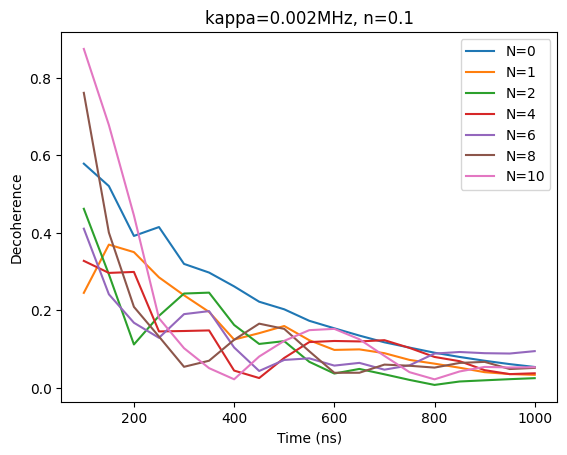

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

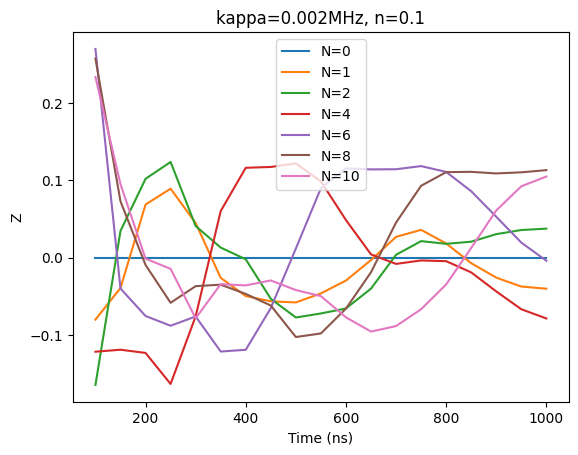

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

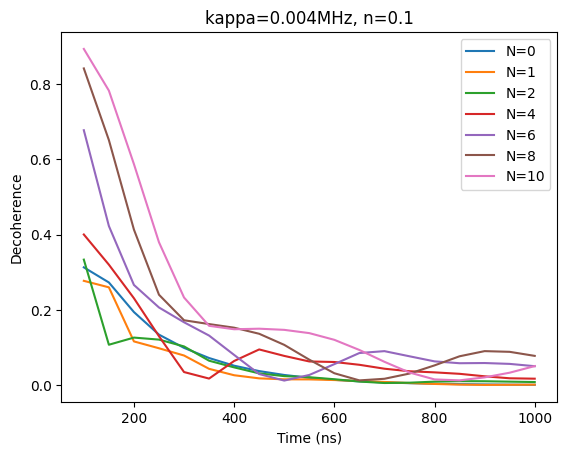

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

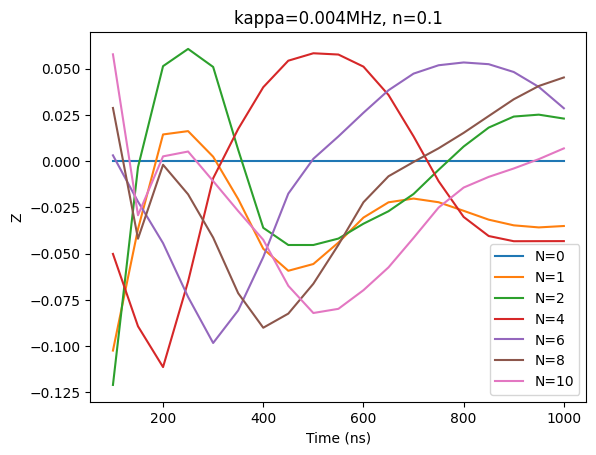

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

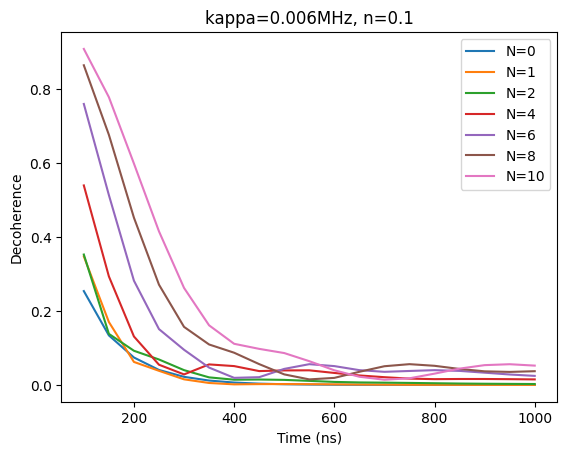

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

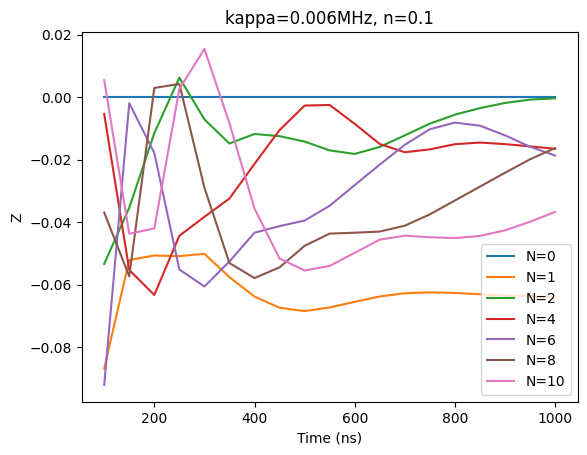

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

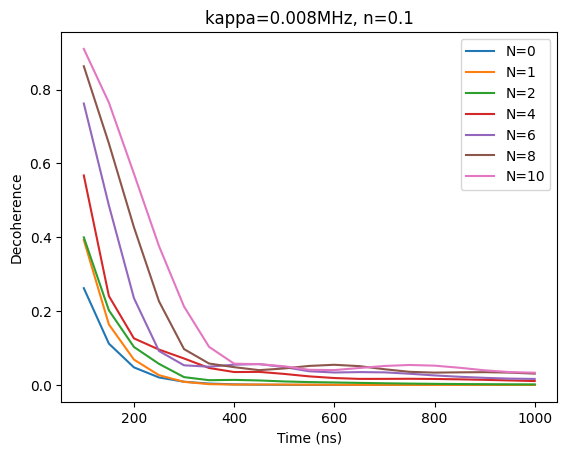

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

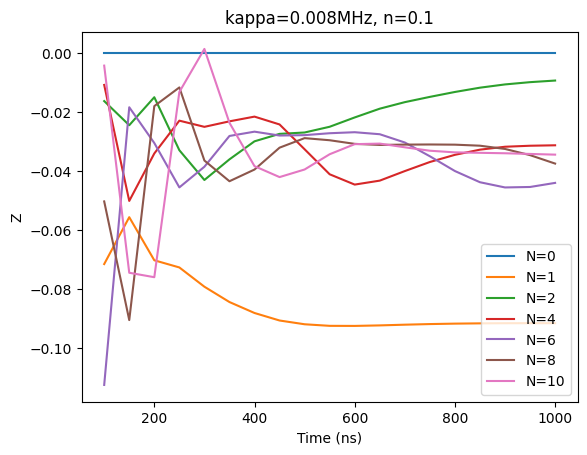

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

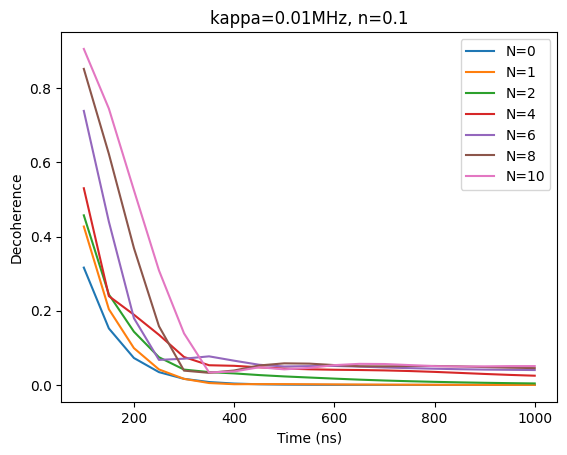

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

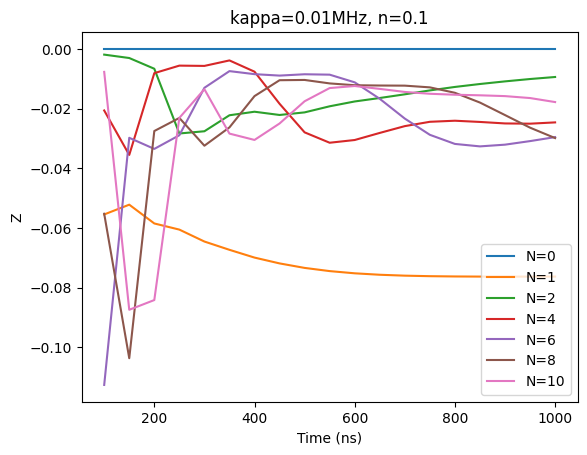

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

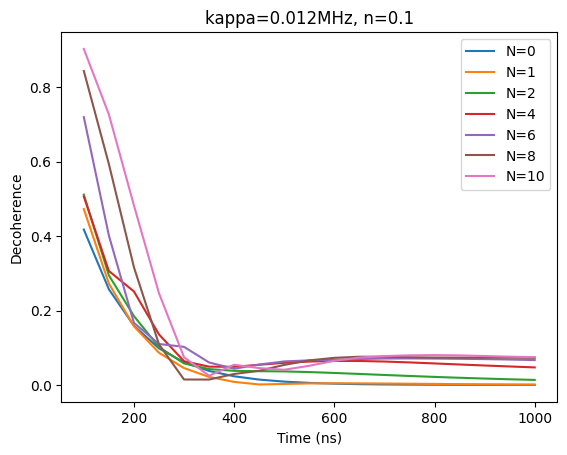

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

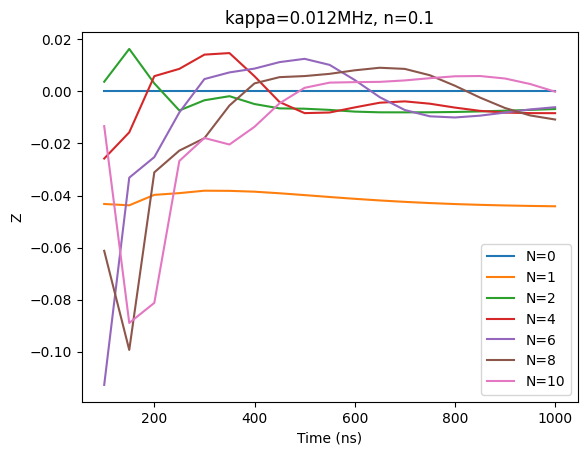

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

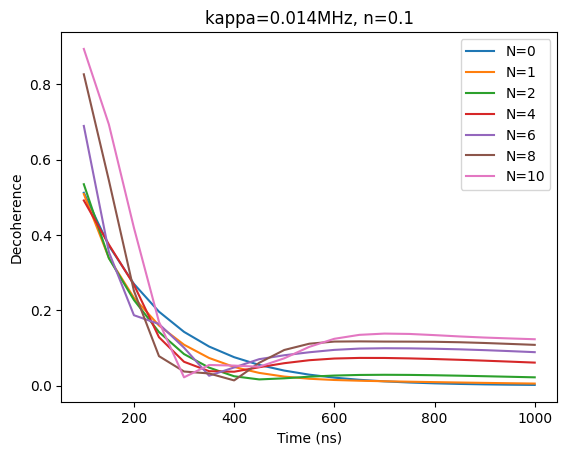

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

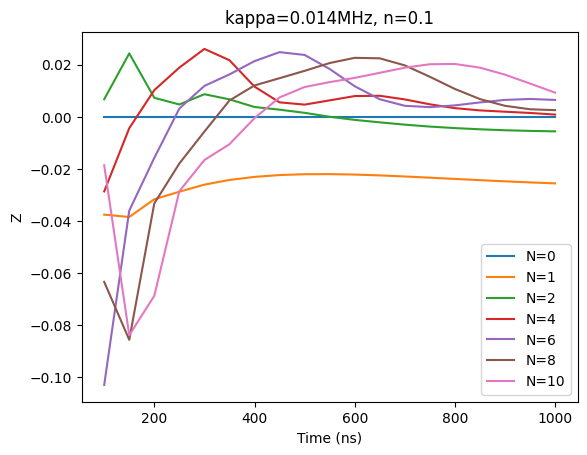

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([result.expect[0], result.expect[1], result.expect[2]]), meth="s")
sphere.show()

## 10) DD $n$=0.4

$\kappa = 2\pi0.002, 2\pi0.004, 2\pi0.006, 2\pi0.008, 2\pi0.010, 2\pi0.012, 2\pi0.014$

$N = 0, 1, 2, 4, 6, 8, 10$


In [ ]:
A = [0.013,0.013,0.0135,0.0135,0.01425,0.01525,0.01525]
alpha = [-0.0647j,-0.1245j,-0.1850j,-0.2320j,-0.285j,-0.3350j,-0.3583j]
kappa_seq = [0.002,0.004,0.006,0.008,0.010,0.012,0.014]
N_seq = [0,1,2,4,6,8,10]
tau_list = [50*(k+2) for k in range(19)]
n_exp = 0.4

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite]

In [ ]:
# iterate for kappa
for i in range(7):

  kappa = 2*np.pi*kappa_seq[i]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = -n_exp*kai*sz_composite + (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(7):

    z = []
    plus = []


    # iterate for evolution time 100ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      x_sub = result.expect[0]
      y_sub = result.expect[1]
      z_sub = result.expect[2]
      plus_sub = result.expect[3]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6


Text(0, 0.5, 'Decoherence')

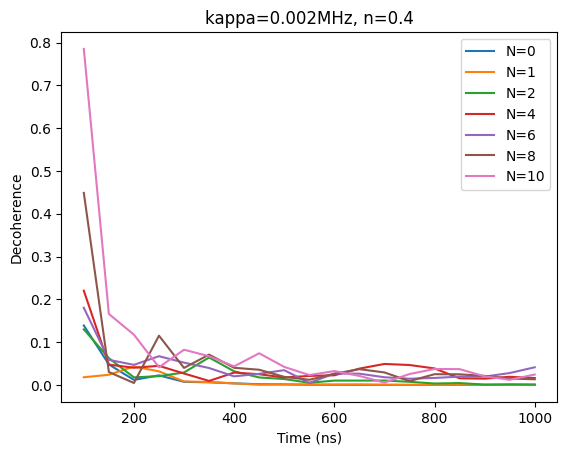

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

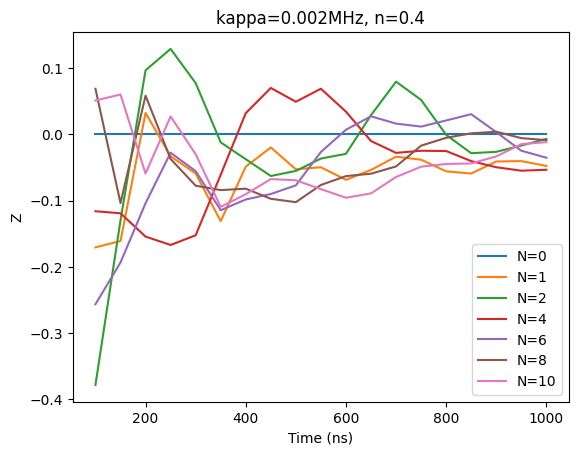

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

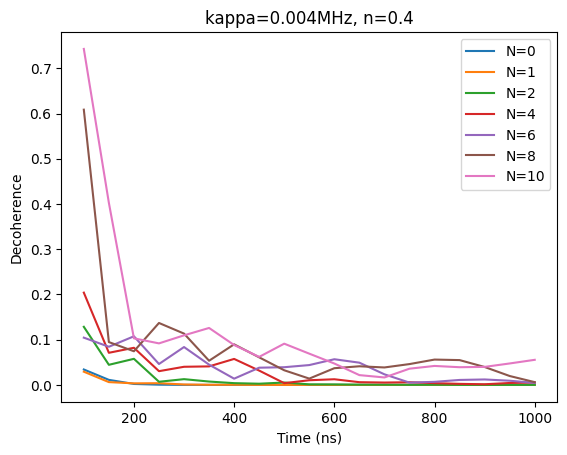

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

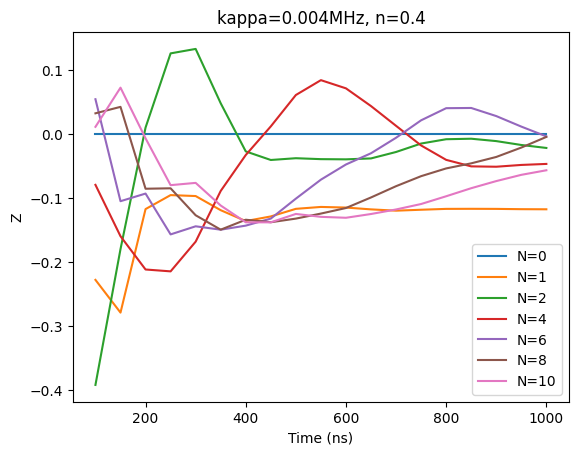

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

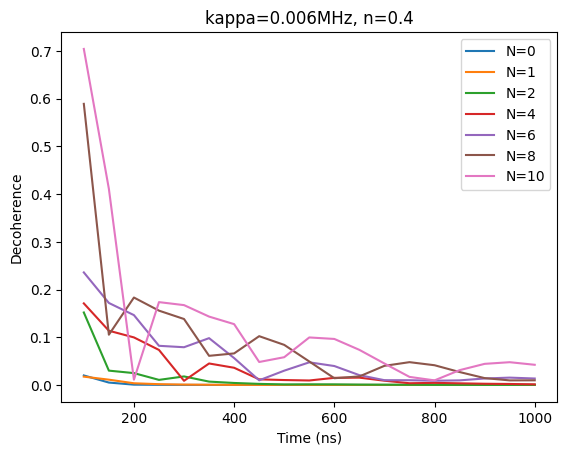

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

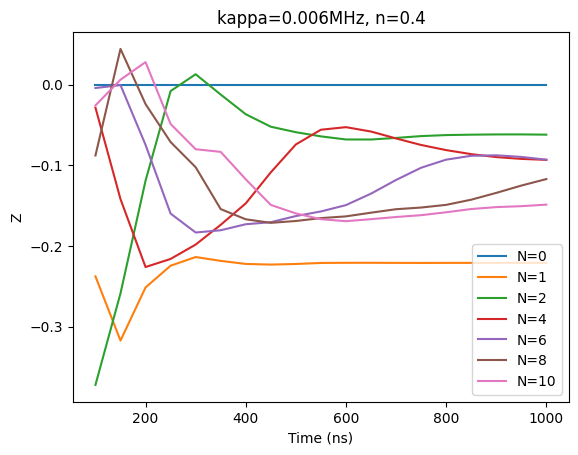

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

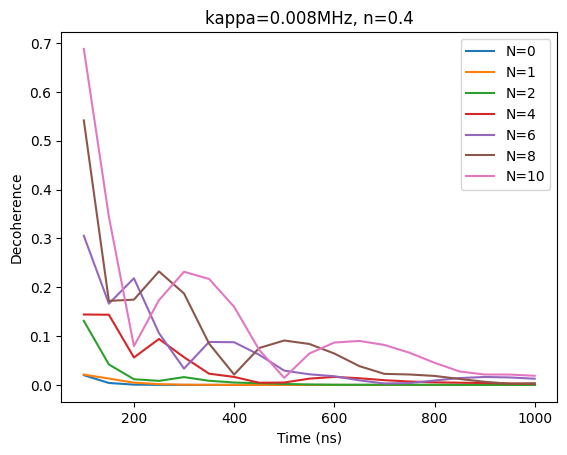

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

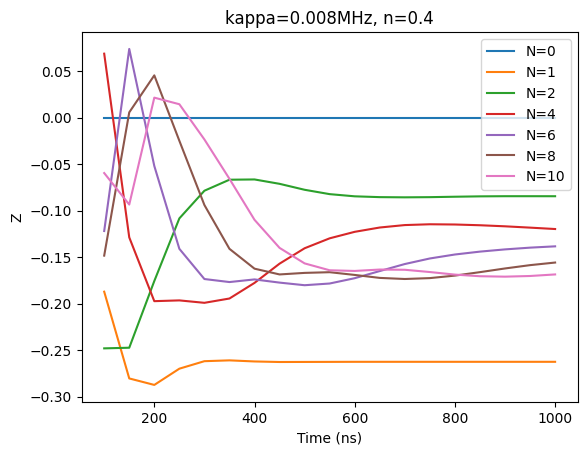

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

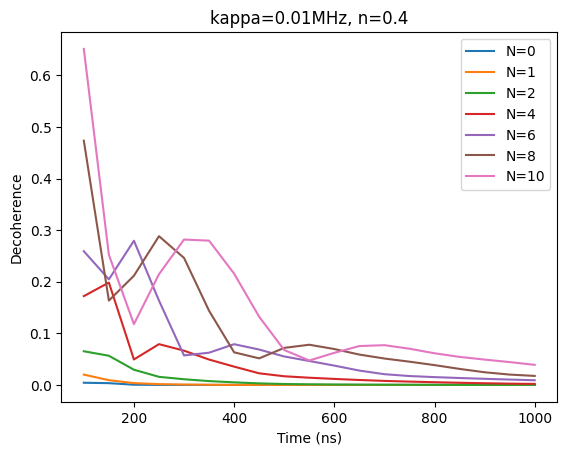

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

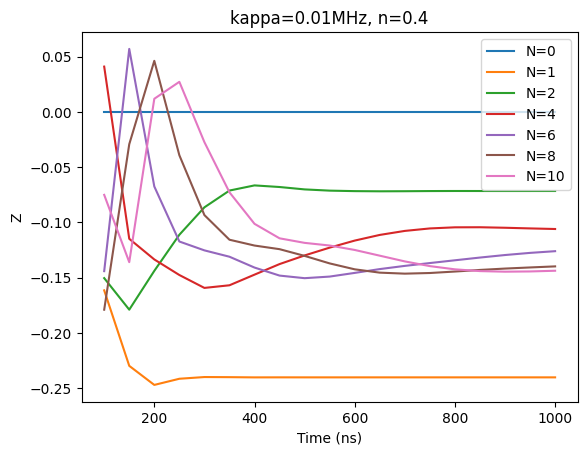

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

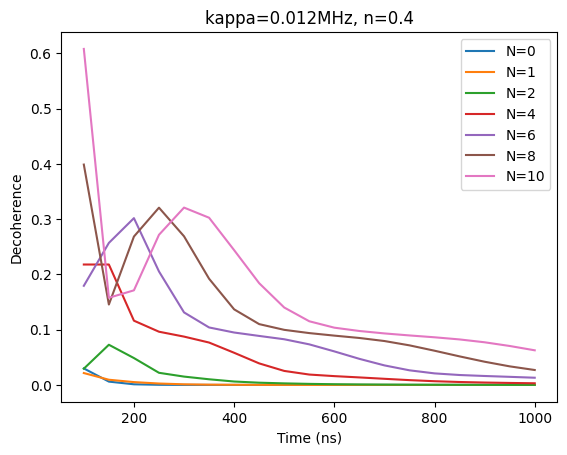

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

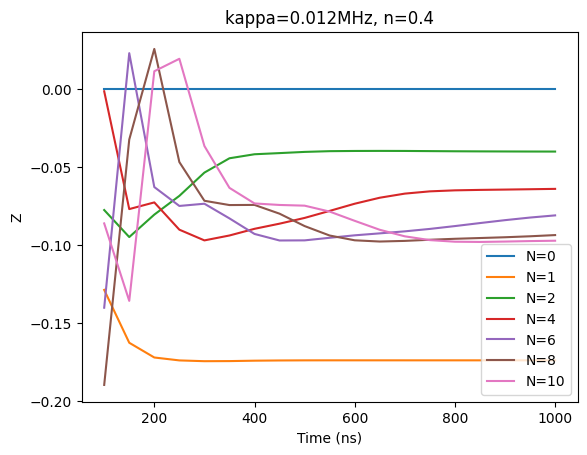

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

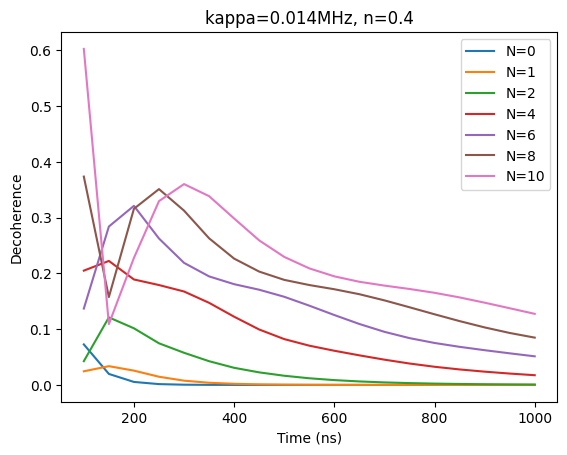

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

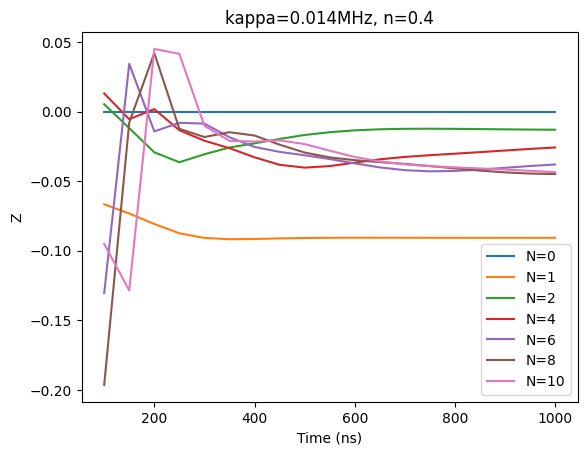

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([result.expect[0], result.expect[1], result.expect[2]]), meth="s")
sphere.show()

## 11) DD $n$=1

$\kappa = 2\pi0.002, 2\pi0.004, 2\pi0.006, 2\pi0.008, 2\pi0.010, 2\pi0.012, 2\pi0.014$

$N = 0, 1, 2, 4, 6, 8, 10$


In [ ]:
A = [0.0207,0.0207,0.0215,0.0225,0.023,0.024,0.024]
alpha = [-0.0959j,-0.1869j,-0.2765j,-0.3606j,-0.460j,-0.4948j,-0.5568j]
kappa_seq = [0.002,0.004,0.006,0.008,0.010,0.012,0.014]
N_seq = [0,1,2,4,6,8,10]
tau_list = [50*(k+2) for k in range(19)]
n_exp = 1

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz

kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite]

In [ ]:
# iterate for kappa
for i in range(7):

  kappa = 2*np.pi*kappa_seq[i]

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = -n_exp*kai*sz_composite + (kappa)*number_composite + kai*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(7):

    z = []
    plus = []


    # iterate for evolution time 100ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt_q': -10, 'T_end_q': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt_r': 0, 'T_end_r': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      x_sub = result.expect[0]
      y_sub = result.expect[1]
      z_sub = result.expect[2]
      plus_sub = result.expect[3]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6


Text(0, 0.5, 'Decoherence')

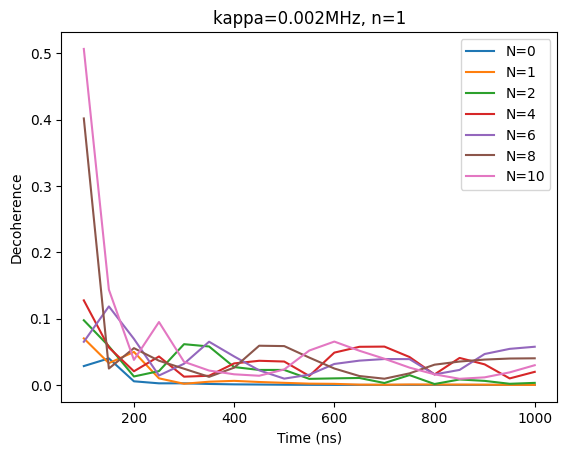

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

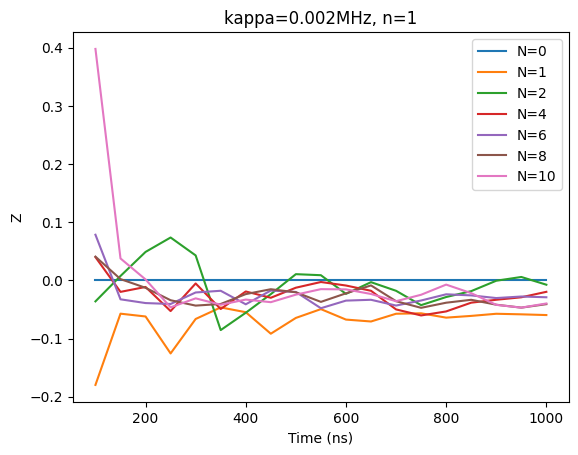

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[0], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

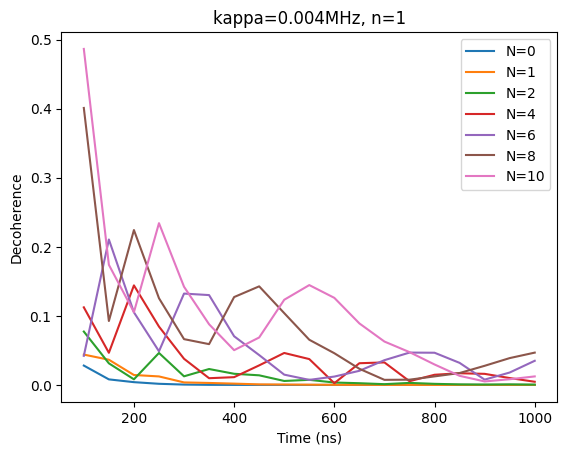

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

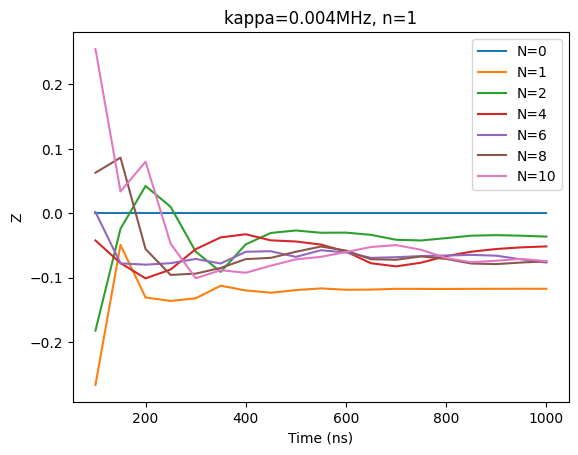

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[1], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

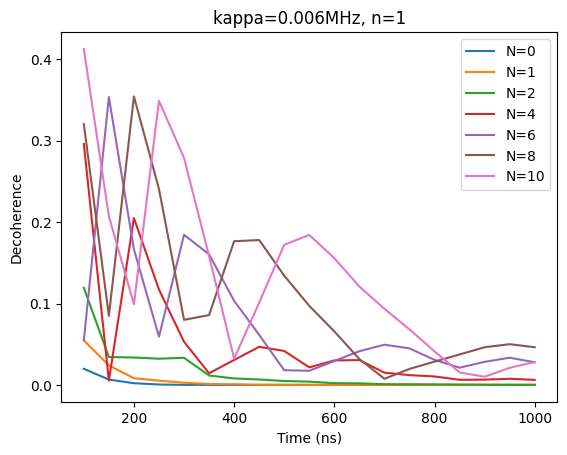

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

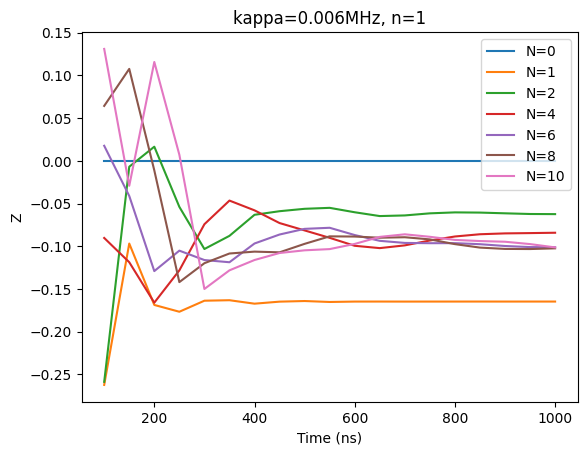

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[2], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

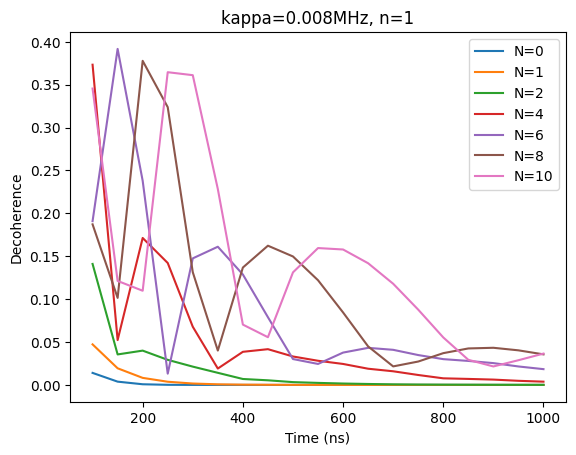

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

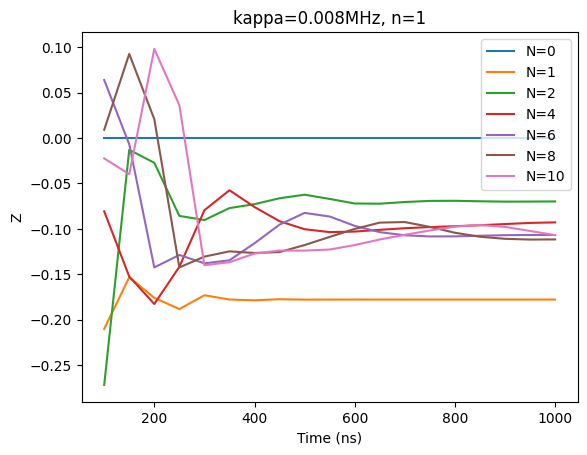

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[3], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

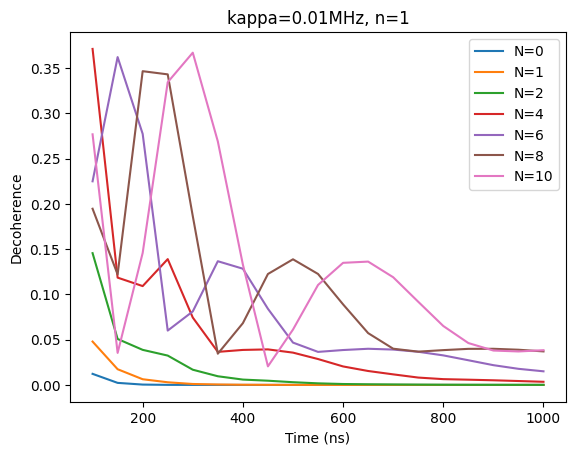

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

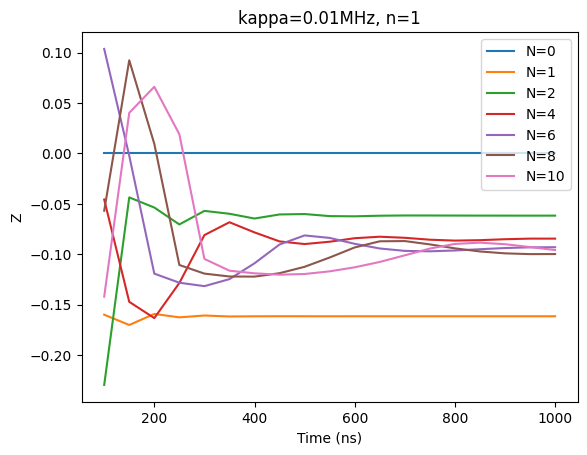

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[4], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

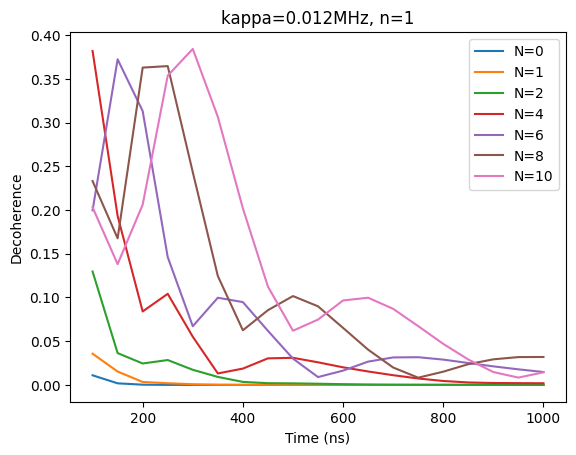

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

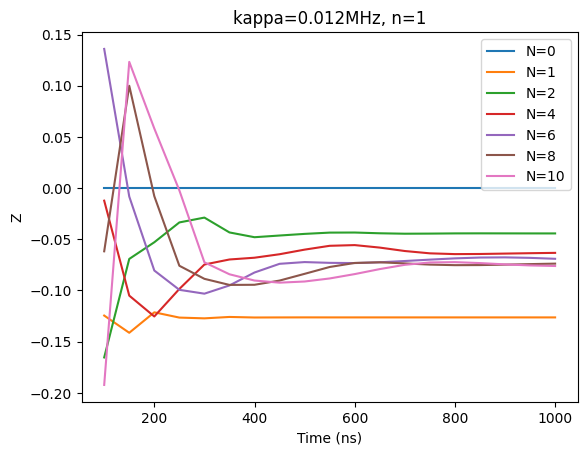

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[5], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

Text(0, 0.5, 'Decoherence')

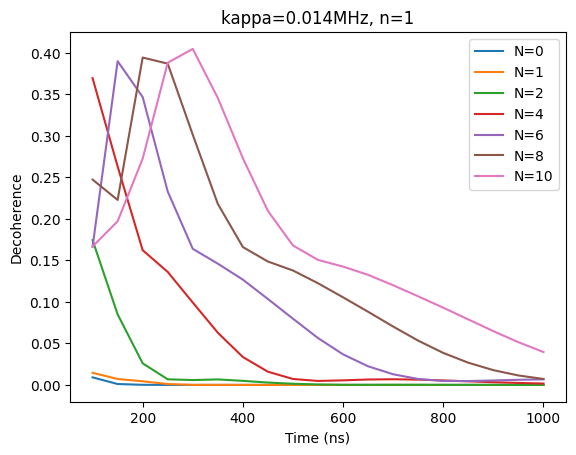

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z')

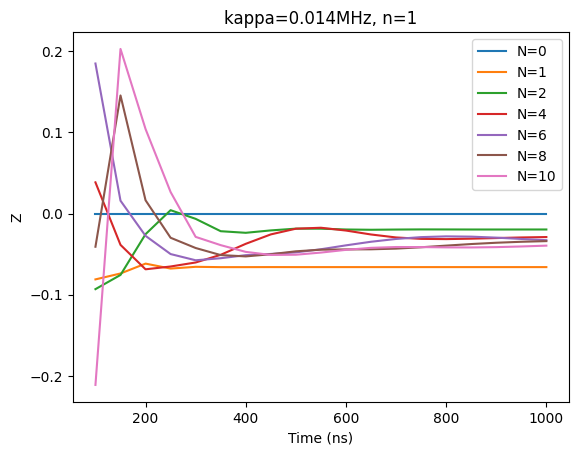

In [ ]:
# Plot Results

for j in range(7):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('kappa={0}MHz, n={1}'.format(kappa_seq[6], n_exp))
plt.xlabel('Time (ns)')
plt.ylabel('Z')

In [ ]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([result.expect[0], result.expect[1], result.expect[2]]), meth="s")
sphere.show()